# Import simple feature

In [1]:
import re
import numpy as np
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import datetime
sns.set()
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 0.23.2.


In [2]:
path = ""
features_domain = pd.read_csv(path+"features_domain.csv").drop("SK_ID_CURR", axis=1)
features_domain

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,TARGET
0,0.0,0.0,1.0,0.0,0.001512,0.090287,0.090032,0.077441,0.256321,0.111161,...,1.0,0.0,1.0,0.0,0.0,0.023640,0.064910,0.377861,0.907618,1
1,0.0,0.0,0.0,0.0,0.002089,0.311736,0.132924,0.271605,0.045016,0.522886,...,0.0,0.0,1.0,0.0,0.0,0.056483,0.070368,0.053985,0.902771,0
2,1.0,1.0,1.0,0.0,0.000358,0.022472,0.020025,0.023569,0.134897,0.651466,...,0.0,0.0,0.0,0.0,0.0,0.023547,0.053193,0.272843,0.983791,0
3,0.0,0.0,1.0,0.0,0.000935,0.066837,0.109477,0.063973,0.107023,0.649154,...,0.0,0.0,0.0,0.0,0.0,0.027278,0.117114,0.711908,0.780594,0
4,0.0,0.0,1.0,0.0,0.000819,0.116854,0.078975,0.117845,0.392880,0.701409,...,0.0,0.0,0.0,0.0,0.0,0.049774,0.095823,0.200770,0.790867,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0.0,0.0,0.0,0.0,0.001127,0.052360,0.101176,0.046016,0.446855,0.103608,...,1.0,0.0,1.0,0.0,0.0,0.019029,0.093162,0.841421,0.965282,0
307507,0.0,0.0,1.0,0.0,0.000396,0.056067,0.040505,0.046016,0.344429,0.748929,...,1.0,0.0,1.0,0.0,1.0,0.044127,0.088746,0.219346,0.837087,0
307508,0.0,0.0,1.0,0.0,0.001089,0.157969,0.110618,0.135802,0.065247,0.421477,...,0.0,0.0,1.0,0.0,0.0,0.052216,0.104341,0.216557,0.273795,0
307509,0.0,0.0,1.0,0.0,0.001243,0.081175,0.072499,0.069585,0.069553,0.252086,...,1.0,0.0,1.0,0.0,0.0,0.025487,0.062873,0.317709,0.450978,1


In [3]:

application_train = pd.read_csv(path+"application_train.csv").drop("SK_ID_CURR", axis=1)
application_train

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')

True_val = application_train['AMT_CREDIT'].to_frame()
True_val['AMT_ANNUITY'] = application_train['AMT_ANNUITY']

# Need to impute missing values
AMT_imp = pd.DataFrame(imputer.fit_transform(True_val), columns=True_val.columns, index = True_val.index)  
AMT_imp['GAIN'] = AMT_imp['AMT_ANNUITY'] * AMT_imp['AMT_CREDIT']
AMT_imp
# test_imp = pd.DataFrame(imputer.transform(test), columns=test.columns)  


,AMT_CREDIT,AMT_ANNUITY,GAIN
0,406597.5,24700.5,1.004316e+10
1,1293502.5,35698.5,4.617610e+10
2,135000.0,6750.0,9.112500e+08
3,312682.5,29686.5,9.282449e+09
4,513000.0,21865.5,1.121700e+10
...,...,...,...
307506,254700.0,27558.0,7.019023e+09
307507,269550.0,12001.5,3.235004e+09
307508,677664.0,29979.0,2.031569e+10
307509,370107.0,20205.0,7.478012e+09


In [5]:
features_domain['AMT_GAIN'] = features_domain['AMT_CREDIT'] * features_domain['AMT_ANNUITY']

In [6]:
feature_matrix = features_domain

In [7]:

feature_matrix2 = feature_matrix

In [8]:
feature_matrix2 

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,TARGET,AMT_GAIN
0,0.0,0.0,1.0,0.0,0.001512,0.090287,0.090032,0.077441,0.256321,0.111161,...,0.0,1.0,0.0,0.0,0.023640,0.064910,0.377861,0.907618,1,0.008129
1,0.0,0.0,0.0,0.0,0.002089,0.311736,0.132924,0.271605,0.045016,0.522886,...,0.0,1.0,0.0,0.0,0.056483,0.070368,0.053985,0.902771,0,0.041437
2,1.0,1.0,1.0,0.0,0.000358,0.022472,0.020025,0.023569,0.134897,0.651466,...,0.0,0.0,0.0,0.0,0.023547,0.053193,0.272843,0.983791,0,0.000450
3,0.0,0.0,1.0,0.0,0.000935,0.066837,0.109477,0.063973,0.107023,0.649154,...,0.0,0.0,0.0,0.0,0.027278,0.117114,0.711908,0.780594,0,0.007317
4,0.0,0.0,1.0,0.0,0.000819,0.116854,0.078975,0.117845,0.392880,0.701409,...,0.0,0.0,0.0,0.0,0.049774,0.095823,0.200770,0.790867,0,0.009229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0.0,0.0,0.0,0.0,0.001127,0.052360,0.101176,0.046016,0.446855,0.103608,...,0.0,1.0,0.0,0.0,0.019029,0.093162,0.841421,0.965282,0,0.005298
307507,0.0,0.0,1.0,0.0,0.000396,0.056067,0.040505,0.046016,0.344429,0.748929,...,0.0,1.0,0.0,1.0,0.044127,0.088746,0.219346,0.837087,0,0.002271
307508,0.0,0.0,1.0,0.0,0.001089,0.157969,0.110618,0.135802,0.065247,0.421477,...,0.0,1.0,0.0,0.0,0.052216,0.104341,0.216557,0.273795,0,0.017474
307509,0.0,0.0,1.0,0.0,0.001243,0.081175,0.072499,0.069585,0.069553,0.252086,...,0.0,1.0,0.0,0.0,0.025487,0.062873,0.317709,0.450978,1,0.005885


# Preproc data

## split train test

In [273]:
train = feature_matrix2 

In [274]:
X_train_origin = train.drop("TARGET", axis = 1)
y_train_origin = train["TARGET"]

In [297]:
from sklearn.model_selection import StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in cv.split(X_train_origin, y_train_origin):
    print(np.max(train_index),np.min(train_index))
    # X_train = X_train_origin.iloc[train_index]
    X_train, X_test = X_train_origin.iloc[train_index], X_train_origin.iloc[test_index]
    y_train, y_test = y_train_origin.iloc[train_index], y_train_origin.iloc[test_index]

print("repartition origin :", np.shape(y_train_origin), list(y_train_origin).count(1)/ len(y_train_origin))
print("repartition après split y_train :", np.shape(y_train), list(y_train).count(1)/ len(y_train))
print("repartition après split y_test :", np.shape(y_test), list(y_test).count(1)/ len(y_test))


307510 0
repartition origin : (307511,) 0.08072881945686496
repartition après split y_train : (246008,) 0.08072908198107379
repartition après split y_test : (61503,) 0.08072776937710356


In [298]:
X_test

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,AMT_GAIN
256571,0.0,1.0,1.0,0.052632,0.001127,0.181097,0.113338,0.161616,0.136490,0.339177,...,0.0,0.0,0.0,0.0,0.0,0.057663,0.103718,0.173432,0.989333,0.020525
191493,0.0,0.0,0.0,0.000000,0.000550,0.079874,0.071411,0.068462,0.097483,0.576888,...,0.0,0.0,0.0,0.0,0.0,0.047793,0.117914,0.317856,0.618324,0.005704
103497,0.0,0.0,1.0,0.000000,0.001050,0.059775,0.066409,0.046016,0.196267,0.941995,...,0.0,0.0,1.0,0.0,0.0,0.022546,0.066812,0.424800,0.932472,0.003970
130646,0.0,0.0,0.0,0.000000,0.001389,0.232637,0.142752,0.207632,0.282797,0.121815,...,0.0,0.0,0.0,0.0,0.0,0.061225,0.108201,0.166644,0.949524,0.033209
211898,0.0,0.0,1.0,0.000000,0.001320,0.069462,0.070376,0.059484,0.491595,0.563585,...,0.0,0.0,0.0,0.0,0.0,0.021134,0.058111,0.378667,0.892818,0.004888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16213,0.0,0.0,1.0,0.000000,0.001166,0.197016,0.101702,0.169473,0.309272,0.756313,...,0.0,0.0,1.0,0.0,1.0,0.060705,0.091015,0.108742,0.837087,0.020037
294620,0.0,1.0,1.0,0.000000,0.001320,0.314607,0.142506,0.315376,0.257000,0.580665,...,1.0,0.0,1.0,0.0,0.0,0.085507,0.112889,0.070004,0.908373,0.044833
234384,0.0,1.0,1.0,0.052632,0.002858,0.048652,0.099228,0.046016,0.138276,0.331454,...,0.0,0.0,1.0,0.0,0.0,0.007806,0.039951,0.886522,0.877457,0.004828
149027,0.0,1.0,1.0,0.000000,0.002666,0.213483,0.172920,0.214366,0.129331,0.218433,...,0.0,0.0,0.0,0.0,0.0,0.031415,0.072471,0.283199,0.868876,0.036916


## Impute "median"

In [276]:
# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')

# Need to impute missing values
X_train_imp = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns, index = X_train.index)  
X_test_imp = pd.DataFrame(imputer.fit_transform(X_test), columns=X_test.columns, index = X_test.index)  
# test_imp = pd.DataFrame(imputer.transform(test), columns=test.columns)  





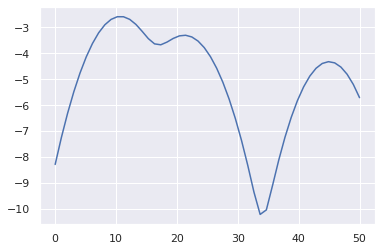

In [277]:
%matplotlib inline

from numpy import array, linspace
from sklearn.neighbors.kde import KernelDensity
from matplotlib.pyplot import plot

a = array([10,11,9,23,21,11,45,20,11,12]).reshape(-1, 1)
kde = KernelDensity(kernel='gaussian', bandwidth=3).fit(a)
s = linspace(0,50)
e = kde.score_samples(s.reshape(-1,1))
plot(s, e)

In [278]:
from sklearn.neighbors import KernelDensity
from scipy.stats import gaussian_kde
from statsmodels.nonparametric.kde import KDEUnivariate
from statsmodels.nonparametric.kernel_density import KDEMultivariate


def kde_scipy(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scipy"""
    # Note that scipy weights its bandwidth by the covariance of the
    # input data.  To make the results comparable to the other methods,
    # we divide the bandwidth by the sample standard deviation here.
    kde = gaussian_kde(x, bw_method=bandwidth / x.std(ddof=1), **kwargs)
    return kde.evaluate(x_grid)


def kde_statsmodels_u(x, x_grid, bandwidth=0.2, **kwargs):
    """Univariate Kernel Density Estimation with Statsmodels"""
    kde = KDEUnivariate(x)
    kde.fit(bw=bandwidth, **kwargs)
    return kde.evaluate(x_grid)
    
    
def kde_statsmodels_m(x, x_grid, bandwidth=0.2, **kwargs):
    """Multivariate Kernel Density Estimation with Statsmodels"""
    kde = KDEMultivariate(x, bw=bandwidth * np.ones_like(x),
                          var_type='c', **kwargs)
    return kde.pdf(x_grid)


def kde_sklearn(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scikit-learn"""
    kde_skl = KernelDensity(bandwidth=bandwidth, **kwargs)
    kde_skl.fit(x[:, np.newaxis])
    # score_samples() returns the log-likelihood of the samples
    log_pdf = kde_skl.score_samples(x_grid[:, np.newaxis])
    return np.exp(log_pdf)


kde_funcs = [kde_statsmodels_u, kde_statsmodels_m, kde_scipy, kde_sklearn]
kde_funcnames = ['Statsmodels-U', 'Statsmodels-M', 'Scipy', 'Scikit-learn']

 

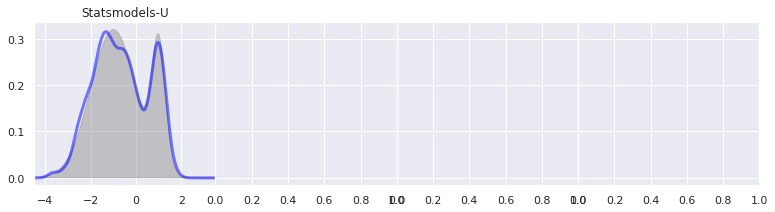

In [279]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats.distributions import norm

# The grid we'll use for plotting
x_grid = np.linspace(-4.5, 3.5, 1000)

# Draw points from a bimodal distribution in 1D
np.random.seed(0)
x = np.concatenate([norm(-1, 1.).rvs(400),
                    norm(1, 0.3).rvs(100)])
pdf_true = (0.8 * norm(-1, 1).pdf(x_grid) +
            0.2 * norm(1, 0.3).pdf(x_grid))

# Plot the three kernel density estimates
fig, ax = plt.subplots(1, 4, sharey=True,
                       figsize=(13, 3))
fig.subplots_adjust(wspace=0)

for i in [0]:
    pdf = kde_statsmodels_u(x, x_grid, bandwidth=0.2)
    ax[i].plot(x_grid, pdf, color='blue', alpha=0.5, lw=3)
    ax[i].fill(x_grid, pdf_true, ec='gray', fc='gray', alpha=0.4)
    ax[i].set_title(kde_funcnames[i])
    ax[i].set_xlim(-4.5, 3.5)

Text(0.5, 1.0, 'Statsmodels-U')

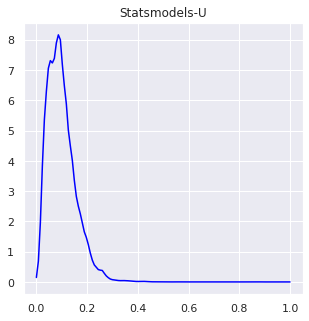

In [280]:
x_grid = np.linspace(0, 1, 128)
x = np.array(X_train_imp['AMT_ANNUITY'])
pdf = kde_statsmodels_u(x, x_grid, bandwidth=0.0075)

fig, ax = plt.subplots(1, sharey=True,figsize=(5, 5))

fig.subplots_adjust(wspace=0)
ax.plot(x_grid, pdf, color='blue')
ax.set_title(kde_funcnames[i])

In [281]:
np.max(x)

1.0

In [282]:
np.shape(x)

(246008,)

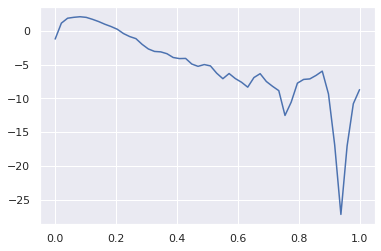

In [283]:
from sklearn.neighbors import KernelDensity
X_ker = np.array(X_train_imp['AMT_ANNUITY']).reshape(-1, 1)
kde = KernelDensity(kernel='gaussian', bandwidth=0.01).fit(X_ker)
s = linspace(0,1, num=50)
e = kde.score_samples(s.reshape(-1,1))
plot(s, e)

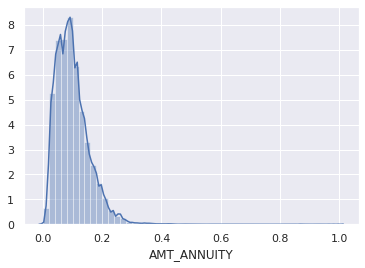

In [284]:
x,y = sns.distplot(X_train_imp['AMT_ANNUITY']).get_lines()[0].get_data()

<AxesSubplot:>

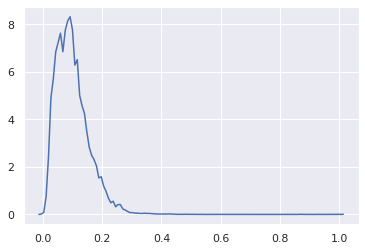

In [285]:
sns.lineplot(x,y)

In [286]:
len(x)

128

# Repartition class

## RF déplacement de seuil imbalanced class

In [88]:
def predict_thr(y_pred_proba, thr) : 

  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(1)
    else : y_pred.append(0)
  return np.array(y_pred)

data loaded


/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-

CPU times: user 11.2 s, sys: 14.2 ms, total: 11.2 s
Wall time: 11.2 s


<AxesSubplot:xlabel='n_estimators', ylabel='score'>

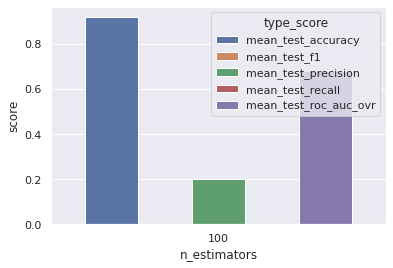

In [103]:
%%time
X_train_20ieme = pickle.load(open('data_20ieme.sav', 'rb'))
y_train_20ieme = pickle.load(open('data_20ieme_y.sav', 'rb'))
print("data loaded")
X_train_20ieme

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedShuffleSplit
import re

score = ["accuracy", "f1", "precision", "recall", "roc_auc_ovr" ]

model = RandomForestClassifier(random_state = 42)
model_name = re.search("(^\w*)", str(model)).group(0).lower()

cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

params = {
    "n_estimators" : [100],
}

grid = GridSearchCV(model, param_grid=params, scoring=score, cv=cv, refit="accuracy")

grid.fit(X_train_20ieme,y_train_20ieme)

col = list(list(grid.cv_results_["params"])[0].keys()) + ["type_score", "score"]
result = []


for key_id, str_key in enumerate(list(grid.cv_results_.keys())) : 

  if str_key.find("mean_test_") == 0 : 
    for key_param, key_values in enumerate(grid.cv_results_[str_key]) : 
      param_value = list(list(grid.cv_results_["params"])[key_param].values())  
      result.append(param_value + [str_key, key_values])
imbaClass = pd.DataFrame(result, columns=col)
sns.barplot(x=col[0], y=col[-1],hue=col[-2], data=imbaClass)

In [105]:
X_train_20ieme = pickle.load(open('data_20ieme.sav', 'rb'))
y_train_20ieme = pickle.load(open('data_20ieme_y.sav', 'rb'))
print("data loaded")
X_train_20ieme

data loaded


,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,AMT_GAIN
0,0.0,0.0,1.0,0.000000,0.000935,0.170748,0.096297,0.127946,0.282797,0.666178,...,0.0,0.0,1.0,0.0,0.0,0.063660,0.103768,0.136985,0.883023,0.016443
1,0.0,0.0,1.0,0.000000,0.000742,0.213483,0.096332,0.214366,0.336758,0.669560,...,0.0,0.0,1.0,0.0,0.0,0.094359,0.124589,0.070024,0.862344,0.020565
2,0.0,0.0,1.0,0.105263,0.001704,0.224045,0.101141,0.158249,0.094492,0.373393,...,0.0,0.0,1.0,0.0,0.0,0.049370,0.065156,0.069984,0.992028,0.022660
3,0.0,0.0,1.0,0.000000,0.002089,0.160674,0.072710,0.161616,0.421848,0.702368,...,0.0,0.0,0.0,0.0,0.0,0.030038,0.039883,0.071830,0.836028,0.011683
4,0.0,0.0,1.0,0.052632,0.000358,0.014202,0.017006,0.012346,0.429796,0.212740,...,0.0,0.0,0.0,0.0,0.0,0.017756,0.047080,0.357422,0.736131,0.000242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12295,0.0,0.0,0.0,0.052632,0.000550,0.101124,0.120885,0.102132,0.143358,0.149267,...,0.0,0.0,1.0,0.0,0.0,0.058953,0.193058,0.492369,0.817541,0.012224
12296,0.0,1.0,1.0,0.000000,0.000742,0.157303,0.088768,0.158249,0.257000,0.751184,...,0.0,0.0,0.0,0.0,0.0,0.070755,0.115398,0.137174,0.582076,0.013964
12297,0.0,0.0,0.0,0.000000,0.001589,0.133569,0.172903,0.113356,0.491595,0.524803,...,0.0,0.0,0.0,0.0,0.0,0.032305,0.115704,0.558424,0.827171,0.023094
12298,0.0,0.0,0.0,0.052632,0.000396,0.124854,0.093296,0.102132,0.129705,0.085400,...,0.0,0.0,0.0,0.0,0.0,0.089284,0.188973,0.242111,0.960836,0.011648


In [87]:
imbaClass

,n_estimators,type_score,score
0,100,mean_test_accuracy,0.919187
1,100,mean_test_f1,0.002000
2,100,mean_test_precision,0.200000
3,100,mean_test_recall,0.001005
4,100,mean_test_roc_auc_ovr,0.681756


In [109]:
y_train_20ieme.values.reshape(len(y_train_20ieme))

array([1, 0, 0, ..., 0, 1, 0])

In [110]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold

X_train_20ieme = pickle.load(open('data_20ieme.sav', 'rb'))
y_train_20ieme = pickle.load(open('data_20ieme_y.sav', 'rb'))


kf = StratifiedKFold(5, shuffle=True, random_state=42) 

fold = 0

x = X_train_20ieme.values
y = y_train_20ieme.values.reshape(len(y_train_20ieme))# Classification

# oversample = RandomOverSampler(sampling_strategy='minority')
# Must specify y StratifiedKFold for

fold=0

score_test = []


x_thrs= np.linspace(0, 1, 30)


print(np.shape(x), np.shape(y_train_20ieme),)

for train, test in kf.split(x,y_train_20ieme):      
    
    
    fold+=1
    xfold_train = x[train]
    yfold_train = y[train]
    xfold_test = x[test]
    yfold_test = y[test]


    model = RandomForestClassifier(random_state = 42)

    model.fit(xfold_train, yfold_train)

    for thr in x_thrs : 
        y_pred_proba= model.predict_proba(xfold_test)
        y_pred = predict_thr(y_pred_proba, thr)


        y_true = yfold_test
        y_test_ohe = pd.get_dummies(yfold_test)


        score_test.append([fold, thr, "accuracy_score", accuracy_score(y_true, y_pred)])
        score_test.append([fold, thr, "f1_score", f1_score(y_true, y_pred)])
        score_test.append([fold, thr, "precision_score", precision_score(y_true, y_pred)])
        score_test.append([fold, thr, "recall_score", recall_score(y_true, y_pred)])
        score_test.append([fold, thr, "roc_auc_score",   roc_auc_score(y_test_ohe, y_pred_proba)])






(12300, 244) (12300, 1)


/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3

/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3

/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3

CPU times: user 15.2 s, sys: 6.51 ms, total: 15.2 s
Wall time: 15.2 s


/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3

In [128]:
proba_imba = pd.DataFrame(score_test, columns=[ "fold", "thr", "type_score", "score"])

proba_imba = pd.DataFrame(score_test, columns=[ "fold", "thr", "type_score", "score"])


y_data = proba_imba.loc[proba_imba.type_score ==  "recall_score" ]
# y_data = proba_imba.groupby("thr").mean()
# y_data["thr"]= y_data.index
y_data

,fold,thr,type_score,score
3,1,0.000000,recall_score,1.000000
8,1,0.034483,recall_score,0.919598
13,1,0.068966,recall_score,0.804020
18,1,0.103448,recall_score,0.577889
23,1,0.137931,recall_score,0.452261
...,...,...,...,...
728,5,0.862069,recall_score,0.000000
733,5,0.896552,recall_score,0.000000
738,5,0.931034,recall_score,0.000000
743,5,0.965517,recall_score,0.000000


,fold,thr,type_score,score_recall
0,1,0.0,accuracy_score,0.080894
1,1,0.0,f1_score,0.149680
2,1,0.0,precision_score,0.080894
3,1,0.0,recall_score,1.000000
4,1,0.0,roc_auc_score,0.700487
...,...,...,...,...
745,5,1.0,accuracy_score,0.919512
746,5,1.0,f1_score,0.000000
747,5,1.0,precision_score,0.000000
748,5,1.0,recall_score,0.000000


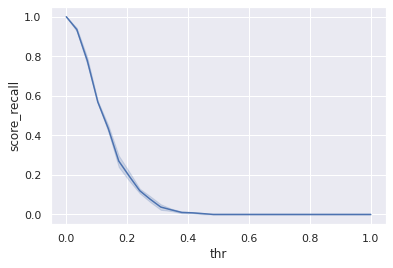

In [134]:

proba_imba = pd.DataFrame(score_test, columns=[ "fold", "thr", "type_score", "score_recall"])


y_data = proba_imba.loc[proba_imba.type_score ==  "recall_score" ]
# y_data = proba_imba.groupby("thr").mean()
# y_data["thr"]= y_data.index
y_data

sns.lineplot(x="thr", y="score_recall", data=y_data)
proba_imba

No handles with labels found to put in legend.


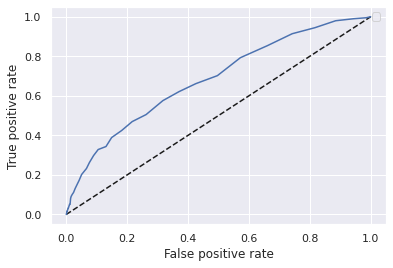

In [137]:
from sklearn.metrics import roc_curve
y_pred_rt= model.predict_proba(xfold_test)[:, 1]
fpr_rt_lm, tpr_rt_lm, _ = roc_curve(yfold_test, y_pred_rt)


plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_rt_lm, tpr_rt_lm)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.legend(loc='best')
plt.show()

In [75]:
from sklearn.model_selection import StratifiedKFold
from imblearn.under_sampling import RandomUnderSampler


kf = StratifiedKFold(5, shuffle=True, random_state=42) 

fold = 0

x = X_train_20ieme.values
y = y_train_20ieme.values.reshape(len(y_train_20ieme)) # Classification

print("xy", np.shape(x), np.shape(y))
model_under_folds = []

fold=0

for train, test in kf.split(x,y_train_20ieme):  
    fold+=1
    xfold_train = x[train]
    yfold_train = y[train]
    xfold_test = x[test]
    yfold_test = y[test]
    
    
    
np.shape(xfold_test_fix), np.shape(yfold_test_fix)


xy (12300, 244) (12300,)


((2460, 244), (2460, 1))

In [69]:
model = RandomForestClassifier(random_state = 42)
model = model.fit(xfold_train, yfold_train)
y_pred = model.predict(xfold_test)
y_pred_proba = model.predict_proba(xfold_test)
y_true = yfold_test
y_true = y_true.reshape(len(y_true))
y_test_ohe = pd.get_dummies(y_true)

<ipython-input-69-0edf26c50219>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model = model.fit(xfold_train, yfold_train)


In [71]:

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score


metric_classique = []
 
metric_classique.append(["accuracy_score", accuracy_score(y_true, y_pred)])
metric_classique.append(["f1_score", f1_score(y_true, y_pred)])
metric_classique.append(["precision_score", precision_score(y_true, y_pred)])
metric_classique.append(["recall_score", recall_score(y_true, y_pred)])
metric_classique.append(["roc_auc_score",   roc_auc_score(y_test_ohe.values[:,1], y_pred_proba[:,1])])

metric_classique


[['accuracy_score', 0.9191056910569105],
 ['f1_score', 0.0],
 ['precision_score', 0.0],
 ['recall_score', 0.0],
 ['roc_auc_score', 0.6820403415231002]]

Si TARGET == 0 sont les positifs : 
nbr de positif =  198 , nbr de positif prédits :  1
nbr de negatif =  2262 , nbr de negatif prédits :  2459
TP =  0
FP =  1
TN =  2261
FN =  198
rappel : TP / (TP + FN) =  0.0
precision : TP / (TP + FP) =  0.0
f mesure : 2TP / (2TP + FP + FN) =  0.0
specificite : TN / (FP + TN) =  0.9995579133510168
accuracy : TP + TN / (TP + FP + TN + FN )   0.9191056910569105


,type_score,score
0,accuracy_score,0.919106
1,f1_score,0.000000
2,precision_score,0.000000
3,recall_score,0.000000


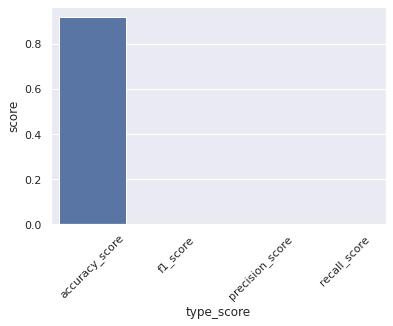

In [67]:

tar = [0,1]

print("Si TARGET == 0 sont les positifs : ")

print("nbr de positif = ",list(y_true).count(tar[1]), ", nbr de positif prédits : ",   list(y_pred).count(tar[1]))
print("nbr de negatif = ",list(y_true).count(tar[0]), ", nbr de negatif prédits : ",   list(y_pred).count(tar[0]))

positif = np.where(y_true ==tar[1])[0]
predi_positif = np.where(y_pred ==tar[1])[0]

negatif = np.where(y_true ==tar[0])[0]
predi_negatif = np.where(y_pred ==tar[0])[0]

TP=0
for idx in predi_positif : 
  if idx in positif : TP +=1
print("TP = ", TP)

FP = 0 
for idx in predi_positif : 
  if idx not in positif : FP +=1
print("FP = ", FP)

TN = 0 
for idx in predi_negatif : 
  if idx in negatif : TN +=1
print("TN = ", TN)

FN = 0 
for idx in predi_negatif : 
  if idx not in negatif : FN +=1
print("FN = ", FN)


rappel = TP / (TP + FN)
precision = TP / (TP + FP)
f_mesure = 2*TP / (2*TP + FP + FN)
specificite =  TN / (FP + TN)
accuracy = (TP + TN) / (TP + FP + TN + FN ) 
print("rappel : TP / (TP + FN) = ", rappel)
print("precision : TP / (TP + FP) = ", precision)
print("f mesure : 2TP / (2TP + FP + FN) = ", f_mesure)
print("specificite : TN / (FP + TN) = ",specificite)
print("accuracy : TP + TN / (TP + FP + TN + FN )  ", accuracy)



score_test = []

score_test.append(["accuracy_score", accuracy ])
score_test.append(["f1_score",f_mesure  ])
score_test.append(["precision_score", precision  ])
score_test.append(["recall_score", rappel])

df = pd.DataFrame(score_test, columns=["type_score", "score"])
sns.barplot(x="type_score", y="score", data=df)
plt.xticks(rotation=45)
df



## RF imbalanced class

/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-

CPU times: user 11.5 s, sys: 5.79 ms, total: 11.5 s
Wall time: 11.5 s


<AxesSubplot:xlabel='n_estimators', ylabel='score'>

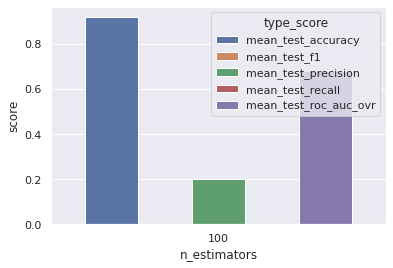

In [260]:
%%time
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedShuffleSplit
import re

score = ["accuracy", "f1", "precision", "recall", "roc_auc_ovr" ]

model = RandomForestClassifier(random_state = 42)
model_name = re.search("(^\w*)", str(model)).group(0).lower()

cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

params = {
    "n_estimators" : [100],
}





grid = GridSearchCV(model, param_grid=params, scoring=score, cv=cv, refit="accuracy")

grid.fit(X_train_20ieme,y_train_20ieme)

col = list(list(grid.cv_results_["params"])[0].keys()) + ["type_score", "score"]
result = []
for key_id, str_key in enumerate(list(grid.cv_results_.keys())) : 

  if str_key.find("mean_test_") == 0 : 
    for key_param, key_values in enumerate(grid.cv_results_[str_key]) : 
      param_value = list(list(grid.cv_results_["params"])[key_param].values())  
      result.append(param_value + [str_key, key_values])
imbaClass = pd.DataFrame(result, columns=col)
sns.barplot(x=col[0], y=col[-1],hue=col[-2], data=imbaClass)

## class_weight="balanced"

/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/ious/miniconda3/envs/python_env/lib/python3.8/site-pack

CPU times: user 9.49 s, sys: 0 ns, total: 9.49 s
Wall time: 9.49 s


<AxesSubplot:xlabel='class_weight', ylabel='score'>

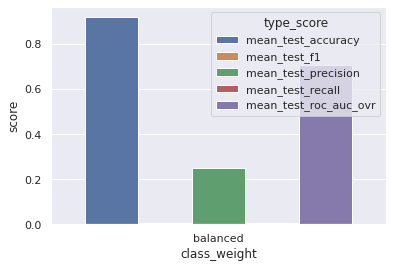

In [258]:
%%time
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedShuffleSplit
import re

score = ["accuracy", "f1", "precision", "recall", "roc_auc_ovr" ]

model = RandomForestClassifier(random_state = 42)
model_name = re.search("(^\w*)", str(model)).group(0).lower()

cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

params = {
    "class_weight" : ["balanced"],
    "n_estimators" : [100]
}

grid = GridSearchCV(model, param_grid=params, scoring=score, cv=cv, refit="accuracy")

grid.fit(X_train_20ieme,y_train_20ieme)

col = list(list(grid.cv_results_["params"])[0].keys()) + ["type_score", "score"]
result = []
for key_id, str_key in enumerate(list(grid.cv_results_.keys())) : 

  if str_key.find("mean_test_") == 0 : 
    for key_param, key_values in enumerate(grid.cv_results_[str_key]) : 
      param_value = list(list(grid.cv_results_["params"])[key_param].values())  
      result.append(param_value + [str_key, key_values])
balanceClass = pd.DataFrame(result, columns=col)
sns.barplot(x=col[0], y=col[-1],hue=col[-2], data=balanceClass)

,class_weight,n_estimators,type_score,score
0,balanced_subsample,100,mean_test_accuracy,0.919320
1,balanced_subsample,100,mean_test_f1,0.003914
2,balanced_subsample,100,mean_test_precision,0.593846
3,balanced_subsample,100,mean_test_recall,0.001964
4,balanced_subsample,100,mean_test_roc_auc_ovr,0.719146


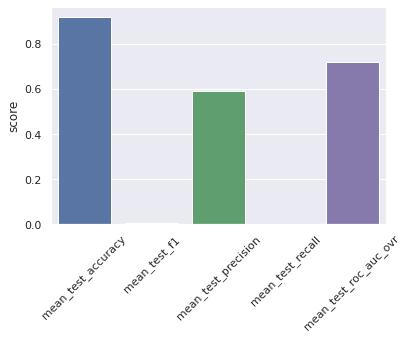

In [109]:
col = balanceClass.columns
sns.barplot(x=col[-2], y=col[-1], data=balanceClass)
plt.xticks(rotation=45)
plt.xlabel('')
balanceClass

In [106]:
balanceClass

,class_weight,n_estimators,type_score,score
0,balanced_subsample,100,mean_test_accuracy,0.919320
1,balanced_subsample,100,mean_test_f1,0.003914
2,balanced_subsample,100,mean_test_precision,0.593846
3,balanced_subsample,100,mean_test_recall,0.001964
4,balanced_subsample,100,mean_test_roc_auc_ovr,0.719146


## OverSampler 

### Effet SMOTE

Counter({0: 9900, 1: 100})


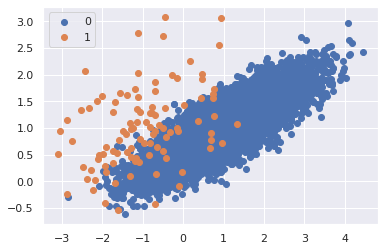

In [218]:

# Generate and plot a synthetic imbalanced classification dataset
from collections import Counter
from sklearn.datasets import make_classification
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
# summarize class distribution
counter = Counter(y)
print(counter)
# scatter plot of examples by class label
for label, _ in counter.items():
	row_ix = where(y == label)[0]
	plt.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
plt.legend()
plt.show()

Counter({0: 9900, 1: 100})
Counter({0: 9900, 1: 9900})


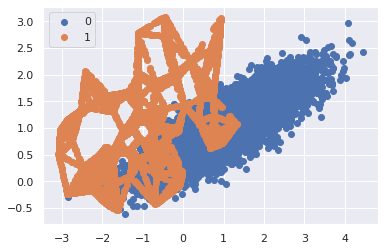

In [219]:
# Oversample and plot imbalanced dataset with SMOTE
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
# summarize class distribution
counter = Counter(y)
print(counter)
# transform the dataset
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)
# summarize the new class distribution
counter = Counter(y)
print(counter)
# scatter plot of examples by class label
for label, _ in counter.items():
	row_ix = where(y == label)[0]
	pyplot.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
pyplot.legend()
pyplot.show()

Counter({0: 9900, 1: 100})
Counter({0: 100, 1: 100})


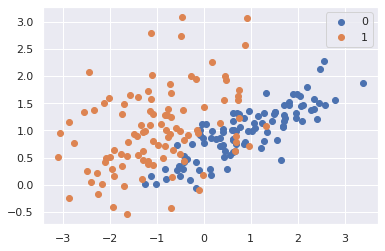

In [221]:
# Oversample and plot imbalanced dataset with SMOTE
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.under_sampling import RandomUnderSampler
from matplotlib import pyplot
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
# summarize class distribution
counter = Counter(y)
print(counter)
# transform the dataset
undersample = RandomUnderSampler()
X, y = undersample.fit_resample(X, y)
# summarize the new class distribution
counter = Counter(y)
print(counter)
# scatter plot of examples by class label
for label, _ in counter.items():
	row_ix = where(y == label)[0]
	pyplot.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
pyplot.legend()
pyplot.show()

In [253]:
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
row_ix = where(y == 0)[0]
X_maj_origin = X[row_ix]
row_ix = where(y == 1)[0]
X_min_origin = X[row_ix]



oversample = SMOTE()
X_smote, y_smote = oversample.fit_resample(X, y)
row_ix = where(y_smote == 0)[0]
X_maj_smote = X_smote[row_ix]
row_ix = where(y_smote == 1)[0]
X_min_smote = X_smote[row_ix]

undersample = RandomUnderSampler()
X_under, y_under = undersample.fit_resample(X, y)
row_ix = where(y_under == 0)[0]
X_maj_under = X_under[row_ix]
row_ix = where(y_under == 1)[0]
X_min_under = X_under[row_ix]


<AxesSubplot:>

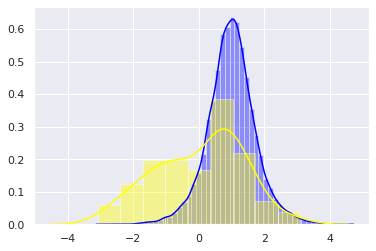

In [254]:
sns.distplot(X_maj_origin, color="blue")
sns.distplot(X_min_origin, color="yellow")

<AxesSubplot:>

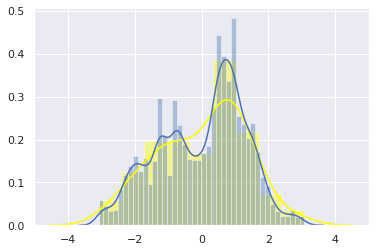

In [250]:
sns.distplot(X_min_origin, color="yellow")
sns.distplot(X_min_smote)

<AxesSubplot:>

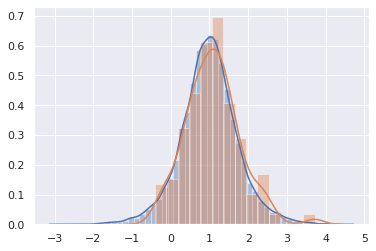

In [256]:
sns.distplot(X_maj_origin)
sns.distplot(X_maj_under)

In [ ]:
sns.scatterplot(data=tips, x="total_bill", y="tip")

No handles with labels found to put in legend.


,fold,type_score,score
0,1,accuracy_score,0.913821
1,1,f1_score,0.027523
2,1,precision_score,0.157895
3,1,recall_score,0.015075
4,1,roc_auc_score,0.695564
5,2,accuracy_score,0.916667
6,2,f1_score,0.037559
7,2,precision_score,0.285714
8,2,recall_score,0.020101
9,2,roc_auc_score,0.676311


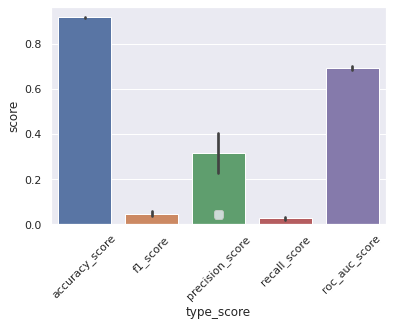

In [140]:
overS = pd.DataFrame(score_test, columns=[ "fold", "type_score", "score"])
sns.barplot(x="type_score", y="score", data=overS)
plt.xticks(rotation=45)
plt.legend(loc ="lower center") 
overS

No handles with labels found to put in legend.


,score,type_score
type_score,,
accuracy_score,0.916667,accuracy_score
f1_score,0.046527,f1_score
precision_score,0.313529,precision_score
recall_score,0.025187,recall_score
roc_auc_score,0.691450,roc_auc_score


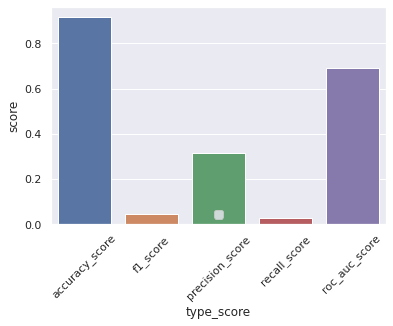

In [141]:
df_mean = overS.groupby('type_score').mean().drop("fold", axis=1)
df_mean["type_score"] = df_mean.index
sns.barplot(x="type_score", y="score", data=df_mean)
plt.xticks(rotation=45)
plt.legend(loc ="lower center") 
df_mean

### kfold à la main : 

In [34]:

import imblearn
print(imblearn.__version__)

0.7.0


In [35]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold


oversample = SMOTE()

kf = StratifiedKFold(5, shuffle=True, random_state=42) 

fold = 0

x = X_train_imp.values
y = y_train.values # Classification

# oversample = RandomOverSampler(sampling_strategy='minority')
# Must specify y StratifiedKFold for
model_SMOTE_folds = []

fold=0

score_test = []

for train, test in kf.split(x,y_train):  
  fold+=1
  print("Fold#{} : \nTrain, Test : {},  {}".format(fold, np.shape(train),np.shape(test)))
      
  xfold_train = x[train]
  yfold_train = y[train]
  xfold_test = x[test]
  yfold_test = y[test]

  xfold_train_SMOTE, yfold_train_SMOTE = oversample.fit_resample(xfold_train, yfold_train)
  
  model = RandomForestClassifier(random_state = 42)

  model.fit(xfold_train_SMOTE, yfold_train_SMOTE)

  model_SMOTE_folds.append(model)

  y_pred = model.predict(xfold_test)
  y_pred_proba= model.predict_proba(xfold_test)
  
  y_true = yfold_test
  y_test_ohe = pd.get_dummies(yfold_test)


  score_test.append([fold, "accuracy_score", accuracy_score(y_true, y_pred)])
  score_test.append([fold, "f1_score", f1_score(y_true, y_pred)])
  score_test.append([fold, "precision_score", precision_score(y_true, y_pred)])
  score_test.append([fold, "recall_score", recall_score(y_true, y_pred)])
  score_test.append([fold, "roc_auc_score",   roc_auc_score(y_test_ohe, y_pred_proba)])



Fold#1 : 
Train, Test : (196806,),  (49202,)
Fold#2 : 
Train, Test : (196806,),  (49202,)
Fold#3 : 
Train, Test : (196806,),  (49202,)
Fold#4 : 
Train, Test : (196807,),  (49201,)
Fold#5 : 
Train, Test : (196807,),  (49201,)
CPU times: user 17min, sys: 4 s, total: 17min 4s
Wall time: 17min 5s


No handles with labels found to put in legend.


,fold,type_score,score
0,1,accuracy_score,0.916853
1,1,f1_score,0.029879
2,1,precision_score,0.257143
3,1,recall_score,0.015861
4,1,roc_auc_score,0.699690
5,2,accuracy_score,0.916507
6,2,f1_score,0.036133
7,2,precision_score,0.265517
8,2,recall_score,0.019386
9,2,roc_auc_score,0.695391


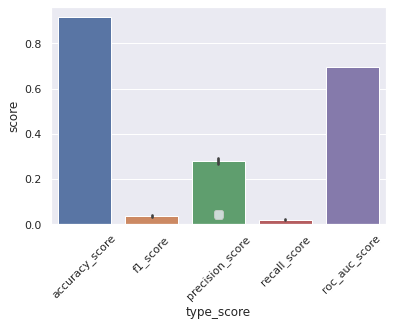

In [36]:
overS = pd.DataFrame(score_test, columns=[ "fold", "type_score", "score"])
sns.barplot(x="type_score", y="score", data=overS)
plt.xticks(rotation=45)
plt.legend(loc ="lower center") 
overS

No handles with labels found to put in legend.


,score,type_score
type_score,,
accuracy_score,0.916787,accuracy_score
f1_score,0.036057,f1_score
precision_score,0.277860,precision_score
recall_score,0.019285,recall_score
roc_auc_score,0.695880,roc_auc_score


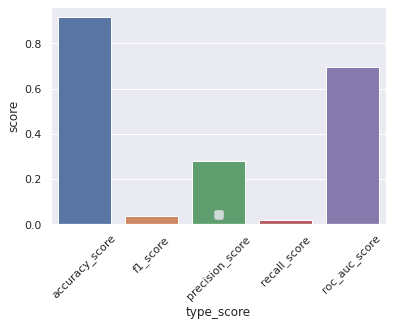

In [37]:
df_mean = overS.groupby('type_score').mean().drop("fold", axis=1)
df_mean["type_score"] = df_mean.index
sns.barplot(x="type_score", y="score", data=df_mean)
plt.xticks(rotation=45)
plt.legend(loc ="lower center") 
df_mean

No handles with labels found to put in legend.


Text(0.5, 0, '')

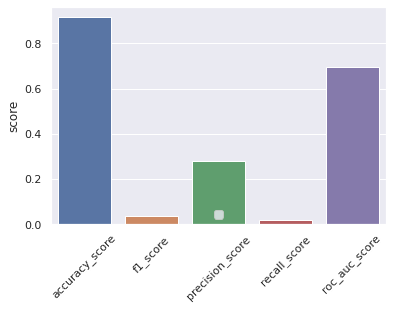

In [111]:
sns.barplot(x="type_score", y="score", data=df_mean)
plt.xticks(rotation=45)
plt.legend(loc ="lower center") 
plt.xlabel('')

### Petit controle de metric 

In [38]:
model = RandomForestClassifier(random_state = 42)
model = model.fit(xfold_train_SMOTE, yfold_train_SMOTE)
y_pred = model.predict(xfold_test)
y_pred_proba = model.predict_proba(xfold_test)
y_true = yfold_test
y_test_ohe = pd.get_dummies(y_true)


Si TARGET == 0 sont les positifs : 
nbr de positif =  3972 , nbr de positif prédits :  266
nbr de negatif =  45229 , nbr de negatif prédits :  48935
TP =  76
FP =  190
TN =  45039
FN =  3896
rappel : TP / (TP + FN) =  0.019133937562940583
precision : TP / (TP + FP) =  0.2857142857142857
f mesure : 2TP / (2TP + FP + FN) =  0.03586597451628126
specificite : TN / (FP + TN) =  0.9957991554091401
accuracy : TP + TN / (TP + FP + TN + FN )   0.9169529074612305


,type_score,score
0,accuracy_score,0.916953
1,f1_score,0.035866
2,precision_score,0.285714
3,recall_score,0.019134


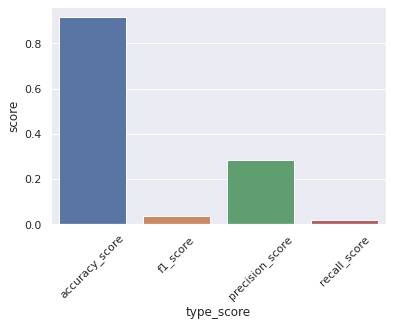

In [39]:
tar = [0,1]

print("Si TARGET == 0 sont les positifs : ")

print("nbr de positif = ",list(y_true).count(tar[1]), ", nbr de positif prédits : ",   list(y_pred).count(tar[1]))
print("nbr de negatif = ",list(y_true).count(tar[0]), ", nbr de negatif prédits : ",   list(y_pred).count(tar[0]))

positif = np.where(y_true ==tar[1])[0]
predi_positif = np.where(y_pred ==tar[1])[0]

negatif = np.where(y_true ==tar[0])[0]
predi_negatif = np.where(y_pred ==tar[0])[0]

TP=0
for idx in predi_positif : 
  if idx in positif : TP +=1
print("TP = ", TP)

FP = 0 
for idx in predi_positif : 
  if idx not in positif : FP +=1
print("FP = ", FP)

TN = 0 
for idx in predi_negatif : 
  if idx in negatif : TN +=1
print("TN = ", TN)

FN = 0 
for idx in predi_negatif : 
  if idx not in negatif : FN +=1
print("FN = ", FN)



print("rappel : TP / (TP + FN) = ", TP / (TP + FN))
print("precision : TP / (TP + FP) = ", TP / (TP + FP))
print("f mesure : 2TP / (2TP + FP + FN) = ", 2*TP / (2*TP + FP + FN))
print("specificite : TN / (FP + TN) = ", TN / (FP + TN))
print("accuracy : TP + TN / (TP + FP + TN + FN )  ", (TP + TN) / (TP + FP + TN + FN ) )



score_test = []

score_test.append(["accuracy_score", (TP + TN) / (TP + FP + TN + FN )  ])
score_test.append(["f1_score", 2*TP / (2*TP + FP + FN)  ])
score_test.append(["precision_score",  TP / (TP + FP)  ])
score_test.append(["recall_score", TP / (TP + FN)])

df = pd.DataFrame(score_test, columns=["type_score", "score"])
sns.barplot(x="type_score", y="score", data=df)
plt.xticks(rotation=45)
df



,type_score,score
0,accuracy_score,0.916953
1,f1_score,0.035866
2,precision_score,0.285714
3,recall_score,0.019134
4,roc_auc_score,0.694799


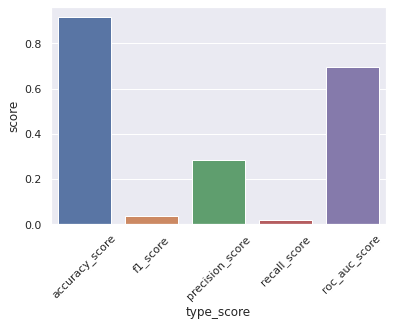

In [40]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

score_test = []

score_test.append(["accuracy_score", accuracy_score(y_true, y_pred)])
score_test.append(["f1_score", f1_score(y_true, y_pred)])
score_test.append(["precision_score", precision_score(y_true, y_pred)])
score_test.append(["recall_score", recall_score(y_true, y_pred)])
score_test.append(["roc_auc_score",   roc_auc_score(y_test_ohe.values[:,1], y_pred_proba[:,1])])


df = pd.DataFrame(score_test, columns=["type_score", "score"])
sns.barplot(x="type_score", y="score", data=df)
plt.xticks(rotation=45)
df

## UnderSampler 

### étude

In [41]:
columns_description = pd.read_csv(path+"HomeCredit_columns_description.csv", encoding= 'unicode_escape')
columns_description.loc[columns_description["Row"] == "RATE_INTEREST_PRIMARY"]



,Unnamed: 0,Table,Row,Description,Special
187,190,previous_application.csv,RATE_INTEREST_PRIMARY,Interest rate normalized on previous credit,normalized


In [42]:
res = [i for i in application_train.columns if "CLI" in i]
res 

['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY']

On veut limiter le nombre de faux négatifs, pour limiter le nombre de rejets infondés. Fixons-nous un taux de faux négatifs tolérable (la proportion de positifs incorrectement prédits négatifs) de 5%. Cela équivaut à une sensibilité de 0.95


$FNR = \frac{FN}{\#pos} = \frac{FN}{TP+FN} = 1 - \frac{TP}{TP+FN} = 1 - sensibilité $

### Cross val

In [49]:

params = {
    "n_estimators" :      [100],
}
from itertools import product
combi_params = [dict(zip(params, v)) for v in product(*params.values())]
combi_params

[{'n_estimators': 100}]

In [50]:
%%time
# define undersampling strategy
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold



kf = StratifiedKFold(5, shuffle=True, random_state=42) 

fold = 0

x = X_train_imp.values
y = y_train.values # Classification

print("xy", np.shape(x), np.shape(y))
model_under_folds = []

fold=0

score_test = []
threshold_fold = []

undersample = RandomUnderSampler(sampling_strategy='majority')

for train, test in kf.split(x,y_train):  

  fold+=1

  print("Fold#{} : \nTrain, Test : {},  {}".format(fold, np.shape(train),np.shape(test)))
      
  xfold_train = x[train]
  yfold_train = y[train]
  xfold_test = x[test]
  yfold_test = y[test]

  # xfold_train_idx = np.transpose(np.array([np.arange(len(train)), train ]))
  xfold_test_idx  = np.transpose(np.array([np.arange(len(test)), test ]))


  xfold_train_under, yfold_train_under = undersample.fit_resample(xfold_train, yfold_train)



  print("xfold_train_under: {}".format(np.shape(xfold_train_under)))
  # variation paramètres modèle

  for param in combi_params : 

    model = RandomForestClassifier(random_state = 42, **param)

    model.fit(xfold_train_under, yfold_train_under)

    model_under_folds.append(model)

    y_pred_proba= model.predict_proba(xfold_test)

    y_true = yfold_test
    
    y_test_ohe = pd.get_dummies(y_true)

    score_test.append([test, str(param), fold, y_pred_proba, y_test_ohe, y_true])

xy (246008, 244) (246008,)
Fold#1 : 
Train, Test : (196806,),  (49202,)
xfold_train_under: (31776, 244)
Fold#2 : 
Train, Test : (196806,),  (49202,)
xfold_train_under: (31776, 244)
Fold#3 : 
Train, Test : (196806,),  (49202,)
xfold_train_under: (31776, 244)
Fold#4 : 
Train, Test : (196807,),  (49201,)
xfold_train_under: (31776, 244)
Fold#5 : 
Train, Test : (196807,),  (49201,)
xfold_train_under: (31776, 244)
CPU times: user 43.8 s, sys: 522 ms, total: 44.4 s
Wall time: 44.4 s


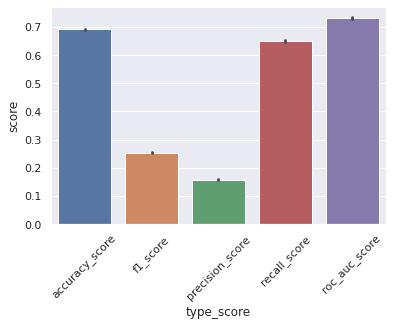

In [51]:

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

df = pd.DataFrame(score_test, columns=["test_idx","param", "fold", "y_pred_proba", "y_true_ohe", "y_true"])
df
# sns.barplot(x="type_score", y="score", data=df)
# plt.xticks(rotation=45)



metric_classique = []
y_pred = []

for idx, row in df.iterrows() :
  y_true = row["y_true"]
  
  y_test_ohe = pd.get_dummies(y_true)
  y_pred_proba =  row["y_pred_proba"]
  y_pred = np.argmax(y_pred_proba,axis=1)
 
  metric_classique.append(["accuracy_score", accuracy_score(y_true, y_pred)])
  metric_classique.append(["f1_score", f1_score(y_true, y_pred)])
  metric_classique.append(["precision_score", precision_score(y_true, y_pred)])
  metric_classique.append(["recall_score", recall_score(y_true, y_pred)])
  metric_classique.append(["roc_auc_score",   roc_auc_score(y_test_ohe.values[:,1], y_pred_proba[:,1])])



df = pd.DataFrame(metric_classique, columns=["type_score", "score"])
sns.barplot(x="type_score", y="score", data=df)
plt.xticks(rotation=45)
df

underS = pd.DataFrame(score_test, columns=["test_idx","param", "fold", "y_pred_proba", "y_true_ohe", "y_true"])




### Cross val lightGM

In [262]:
2**30

1073741824

In [263]:
import lightgbm as lgb

# model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
#                                    class_weight = 'balanced', learning_rate = 0.05, 
#                                    reg_alpha = 0.1, reg_lambda = 0.1, 
#                                    subsample = 0.8, n_jobs = -1, random_state = 50)


params = {
 "n_estimators": [100, 1000],
 "max_depth":[5,7,-1],
 "num_leaves":[9,31,127],
 "objective": ["binary"],
 "class_weight" : ['balanced'], 
 "learning_rate" : [0.03,0.05],
 "reg_alpha" : [0.1], 
 "reg_lambda" : [0.1],
 "subsample" : [0.8], 
 "n_jobs" : [-1], 
 "random_state" : [50]
}

In [264]:
from itertools import product
combi_params = [dict(zip(params, v)) for v in product(*params.values())]
combi_params

[{'n_estimators': 100,
  'max_depth': 5,
  'num_leaves': 9,
  'objective': 'binary',
  'class_weight': 'balanced',
  'learning_rate': 0.03,
  'reg_alpha': 0.1,
  'reg_lambda': 0.1,
  'subsample': 0.8,
  'n_jobs': -1,
  'random_state': 50},
 {'n_estimators': 100,
  'max_depth': 5,
  'num_leaves': 9,
  'objective': 'binary',
  'class_weight': 'balanced',
  'learning_rate': 0.05,
  'reg_alpha': 0.1,
  'reg_lambda': 0.1,
  'subsample': 0.8,
  'n_jobs': -1,
  'random_state': 50},
 {'n_estimators': 100,
  'max_depth': 5,
  'num_leaves': 31,
  'objective': 'binary',
  'class_weight': 'balanced',
  'learning_rate': 0.03,
  'reg_alpha': 0.1,
  'reg_lambda': 0.1,
  'subsample': 0.8,
  'n_jobs': -1,
  'random_state': 50},
 {'n_estimators': 100,
  'max_depth': 5,
  'num_leaves': 31,
  'objective': 'binary',
  'class_weight': 'balanced',
  'learning_rate': 0.05,
  'reg_alpha': 0.1,
  'reg_lambda': 0.1,
  'subsample': 0.8,
  'n_jobs': -1,
  'random_state': 50},
 {'n_estimators': 100,
  'max_depth': 

In [310]:
%%time
# define undersampling strategy
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold



kf = StratifiedKFold(5, shuffle=True, random_state=42) 

fold = 0

x = X_train_imp.values
y = y_train.values # Classification

print("xy", np.shape(x), np.shape(y))
model_under_folds = []

fold=0

score_test = []
threshold_fold = []

undersample = RandomUnderSampler(sampling_strategy='majority')

for train, test in kf.split(x,y_train):  

  fold+=1

  print("Fold#{} : \nTrain, Test : {},  {}".format(fold, np.shape(train),np.shape(test)))
      
  xfold_train = x[train]
  yfold_train = y[train]
  xfold_test = x[test]
  yfold_test = y[test]

  # xfold_train_idx = np.transpose(np.array([np.arange(len(train)), train ]))
  xfold_test_idx  = np.transpose(np.array([np.arange(len(test)), test ]))


  xfold_train_under, yfold_train_under = undersample.fit_resample(xfold_train, yfold_train)



  print("xfold_train_under: {}".format(np.shape(xfold_train_under)))
  # variation paramètres modèle

  for param in combi_params : 

    model = lgb.LGBMClassifier(**param)

    model.fit(xfold_train_under, yfold_train_under)

    model_under_folds.append(model)

    y_pred_proba= model.predict_proba(xfold_test)

    y_true = yfold_test
    
    y_test_ohe = pd.get_dummies(y_true)

    score_test.append([test, str(param), fold, y_pred_proba, y_test_ohe, y_true])

xy (246008, 244) (246008,)
Fold#1 : 
Train, Test : (196806,),  (49202,)
xfold_train_under: (31776, 244)
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
Fold#2 : 
Train, Test : (196806,),  (49202,)
xfold_train_under: (31776, 244)
[Li

,type_score,score,param
0,accuracy_score,0.674525,"{'n_estimators': 100, 'max_depth': 5, 'num_lea..."
1,f1_score,0.252590,"{'n_estimators': 100, 'max_depth': 5, 'num_lea..."
2,precision_score,0.155036,"{'n_estimators': 100, 'max_depth': 5, 'num_lea..."
3,recall_score,0.681269,"{'n_estimators': 100, 'max_depth': 5, 'num_lea..."
4,roc_auc_score,0.740799,"{'n_estimators': 100, 'max_depth': 5, 'num_lea..."
...,...,...,...
895,accuracy_score,0.686368,"{'n_estimators': 1000, 'max_depth': -1, 'num_l..."
896,f1_score,0.261639,"{'n_estimators': 1000, 'max_depth': -1, 'num_l..."
897,precision_score,0.161517,"{'n_estimators': 1000, 'max_depth': -1, 'num_l..."
898,recall_score,0.688318,"{'n_estimators': 1000, 'max_depth': -1, 'num_l..."


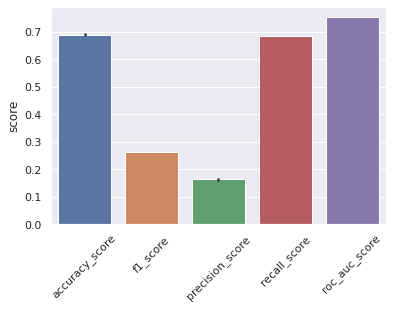

In [312]:

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

df = pd.DataFrame(score_test, columns=["test_idx","param", "fold", "y_pred_proba", "y_true_ohe", "y_true"])
df_lightGBM_result = df.copy()
# sns.barplot(x="type_score", y="score", data=df)
# plt.xticks(rotation=45)



metric_classique = []
y_pred = []

for idx, row in df.iterrows() :
  y_true = row["y_true"]
  
  y_test_ohe = pd.get_dummies(y_true)
  y_pred_proba =  row["y_pred_proba"]
  y_pred = np.argmax(y_pred_proba,axis=1)
 
  metric_classique.append(["accuracy_score", accuracy_score(y_true, y_pred), row["param"]])
  metric_classique.append(["f1_score", f1_score(y_true, y_pred), row["param"]])
  metric_classique.append(["precision_score", precision_score(y_true, y_pred),row["param"]])
  metric_classique.append(["recall_score", recall_score(y_true, y_pred), row["param"]])
  metric_classique.append(["roc_auc_score",   roc_auc_score(y_test_ohe.values[:,1], y_pred_proba[:,1]), row["param"]])



df_lightGBM = pd.DataFrame(metric_classique, columns=["type_score", "score", "param"])
sns.barplot(x="type_score", y="score", data=df_lightGBM)
plt.xticks(rotation=45)
plt.xlabel('')

df_lightGBM

# df_lightGBM = pd.DataFrame(score_test, columns=["test_idx","param", "fold", "y_pred_proba", "y_true_ohe", "y_true"])




In [314]:
df_lightGBM_result

,test_idx,param,fold,y_pred_proba,y_true_ohe,y_true
0,"[13, 15, 21, 23, 28, 34, 35, 37, 48, 52, 56, 5...","{'n_estimators': 100, 'max_depth': 5, 'num_lea...",1,"[[0.7292208223232521, 0.27077917767674786], [0...",0 1 0 1 0 1 1 0 2 1 ...,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[13, 15, 21, 23, 28, 34, 35, 37, 48, 52, 56, 5...","{'n_estimators': 100, 'max_depth': 5, 'num_lea...",1,"[[0.7713555491312701, 0.22864445086872984], [0...",0 1 0 1 0 1 1 0 2 1 ...,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
2,"[13, 15, 21, 23, 28, 34, 35, 37, 48, 52, 56, 5...","{'n_estimators': 100, 'max_depth': 5, 'num_lea...",1,"[[0.7523893136208487, 0.2476106863791513], [0....",0 1 0 1 0 1 1 0 2 1 ...,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[13, 15, 21, 23, 28, 34, 35, 37, 48, 52, 56, 5...","{'n_estimators': 100, 'max_depth': 5, 'num_lea...",1,"[[0.7787731434414129, 0.22122685655858704], [0...",0 1 0 1 0 1 1 0 2 1 ...,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
4,"[13, 15, 21, 23, 28, 34, 35, 37, 48, 52, 56, 5...","{'n_estimators': 100, 'max_depth': 5, 'num_lea...",1,"[[0.761122631374031, 0.23887736862596898], [0....",0 1 0 1 0 1 1 0 2 1 ...,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...,...
175,"[2, 4, 9, 14, 18, 24, 32, 44, 49, 53, 55, 69, ...","{'n_estimators': 1000, 'max_depth': -1, 'num_l...",5,"[[0.6899917448020245, 0.3100082551979754], [0....",0 1 0 0 1 1 1 0 2 1 ...,"[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
176,"[2, 4, 9, 14, 18, 24, 32, 44, 49, 53, 55, 69, ...","{'n_estimators': 1000, 'max_depth': -1, 'num_l...",5,"[[0.7234752285627651, 0.27652477143723486], [0...",0 1 0 0 1 1 1 0 2 1 ...,"[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
177,"[2, 4, 9, 14, 18, 24, 32, 44, 49, 53, 55, 69, ...","{'n_estimators': 1000, 'max_depth': -1, 'num_l...",5,"[[0.5898826426553327, 0.4101173573446672], [0....",0 1 0 0 1 1 1 0 2 1 ...,"[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
178,"[2, 4, 9, 14, 18, 24, 32, 44, 49, 53, 55, 69, ...","{'n_estimators': 1000, 'max_depth': -1, 'num_l...",5,"[[0.567376870687494, 0.43262312931250596], [0....",0 1 0 0 1 1 1 0 2 1 ...,"[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."


In [44]:
id_best_config =  df_lightGBM.loc[df_lightGBM["type_score"] == "recall_score"].score.idxmax()
best_param =  df_lightGBM.loc[id_best_config, "param"]
print("best_param", best_param)

best_param {'n_estimators': 1000, 'max_depth': 5, 'num_leaves': 127, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.03, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}


### scoring simple

In [300]:
def predict_thr(y_pred_proba, thr) : 

  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(1)
    else : y_pred.append(0)
  return np.array(y_pred)

In [301]:
def scoring_simple(y_pred, y_true, idx_test) : 
  tar = [0,1]
  
  nbr_positif = list(y_true).count(tar[1])
  positif = np.where(y_true ==tar[1])[0]
  predi_positif = np.where(y_pred ==tar[1])[0]

  nbr_negatif = list(y_true).count(tar[0])
  negatif = np.where(y_true ==tar[0])[0]
  predi_negatif = np.where(y_pred ==tar[0])[0]

  TN = len(list(set(predi_negatif) & set(negatif)))

  FN = len(predi_negatif) -TN 

  score = 0
  if nbr_negatif >0 : score = (TN - FN*10)/nbr_negatif

  return score

def score_s(y_pred_proba, thr,y_true,idx_test ) : 
  y_pred = predict_thr(y_pred_proba,thr)
  return scoring_simple(y_pred, y_true, idx_test)



In [65]:
x= np.linspace(0, 1, 30)

plot_score_TN_FN = []

for i, row in df_lightGBM_result.iterrows() :
    
    y_true = row["y_true"]
    y_proba =row["y_pred_proba"]
    idx_test = X_train_imp.index[row["test_idx"]] 

    y_Gain_loss = []
    y_TN_FN =  []

    for thr in x : 
        y_TN_FN.append(score_s(y_proba,thr,y_true, idx_test)) 

    plot_score_TN_FN.append([x, y_TN_FN,row["param"], row["fold"]])


In [66]:
plot_score_TN_FN

[]

In [51]:
psdf = pd.DataFrame(plot_score_TN_FN, columns=["x","y", "param", "fold"])
x= psdf["x"][0]
fig = plt.figure(figsize=(10,7))
ax = plt.subplot(111)
for idx, row in psdf.iterrows() : 
  y = row["y"]
  ax.plot(x, y, label=row["param"] + ", fold=" + str(row["fold"]))
  ax.scatter(x, y)
  ax.legend()
plt.show()

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
params = psdf["param"].unique()
mean_param_score = []

for para in params : 
  meanfold_score = 0
  param_df = psdf.loc[psdf["param"] == para]
  for idx, row in param_df.iterrows() : 
    meanfold_score+=np.array(row["y"]) / param_df.shape[0]
  mean_param_score.append(meanfold_score)
np.shape(np.transpose(mean_param_score))

mean_param_score_df = pd.DataFrame(np.transpose(mean_param_score), columns=[params])

fig = plt.figure(figsize=(10,7))
ax = plt.subplot(111)

for k in range(np.shape(mean_param_score_df)[1]) : 
  x= psdf["x"][0]
  # x= np.linspace(0, 1, 30)
  y = mean_param_score_df.iloc[:, k]
  ax.plot(x, y, label=mean_param_score_df.columns[k][0]      )
  ax.scatter(x, y)
  ax.legend()

plt.show()

### scoring Gain Loss

In [330]:
def predict_thr(y_pred_proba, thr) : 

  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(1)
    else : y_pred.append(0)
  return np.array(y_pred)

def scoring_GL(y_pred, y_true, idx_test) : 
    tar = [0,1]

    nbr_positif = list(y_true).count(tar[1])
    positif = np.where(y_true ==tar[1])[0]
    predi_positif = np.where(y_pred ==tar[1])[0]

    nbr_negatif = list(y_true).count(tar[0])
    negatif = np.where(y_true ==tar[0])[0]
    predi_negatif = np.where(y_pred ==tar[0])[0]

    new_idx_Gmax   = idx_test[list(set(negatif))]
    new_idx_G      = idx_test[list(set(predi_negatif) & set(negatif))]

    dataF = X_train_origin
#     if idx_test.any() in list(X_test_imp.index) : dataF = X_test_imp 
        
    
    G_max = dataF.loc[new_idx_Gmax, "AMT_CREDIT"].sum()
    G = dataF.loc[new_idx_G, "AMT_CREDIT"].sum()

    new_idx_Lmax   = idx_test[list(set(positif))]
    diff_idx_L     = list(set(predi_negatif) ^ set(negatif))
    new_idx_L      = idx_test[list(set(predi_negatif) & set(diff_idx_L))]


    L_max = dataF.loc[new_idx_Lmax, "AMT_CREDIT"].sum()
    L = dataF.loc[new_idx_L, "AMT_CREDIT"].sum()


    if G_max >0 :  score_GL = (G - L*10)/G_max


    return score_GL

def score_GL(y_pred_proba, thr,y_true,idx_test ) : 
  y_pred = predict_thr(y_pred_proba,thr)
  return scoring_GL(y_pred, y_true, idx_test)


In [331]:
x= np.linspace(0, 1, 30)

plot_score_GL = []

for i, row in df_lightGBM_result.iterrows() :
    y_true = row["y_true"]
    y_proba =row["y_pred_proba"]
    idx_test = X_train_imp.index[row["test_idx"]] 

    y_GL = []

    print("i", i, idx_test)

    for thr in x : 
        y_GL.append(score_GL(y_proba,thr,y_true, idx_test)) 

    plot_score_GL.append([x, y_GL,row["param"], row["fold"]])

i 0 Int64Index([ 97464,  23750,  29456, 148624, 247351,   8119, 106587, 155536,
            177156, 129755,
            ...
            130523,  16120, 164770, 249613, 264966,  36034,  60759,  30712,
            177502,  70057],
           dtype='int64', length=49202)
i 1 Int64Index([ 97464,  23750,  29456, 148624, 247351,   8119, 106587, 155536,
            177156, 129755,
            ...
            130523,  16120, 164770, 249613, 264966,  36034,  60759,  30712,
            177502,  70057],
           dtype='int64', length=49202)
i 2 Int64Index([ 97464,  23750,  29456, 148624, 247351,   8119, 106587, 155536,
            177156, 129755,
            ...
            130523,  16120, 164770, 249613, 264966,  36034,  60759,  30712,
            177502,  70057],
           dtype='int64', length=49202)
i 3 Int64Index([ 97464,  23750,  29456, 148624, 247351,   8119, 106587, 155536,
            177156, 129755,
            ...
            130523,  16120, 164770, 249613, 264966,  36034,  60759,  

KeyboardInterrupt: 

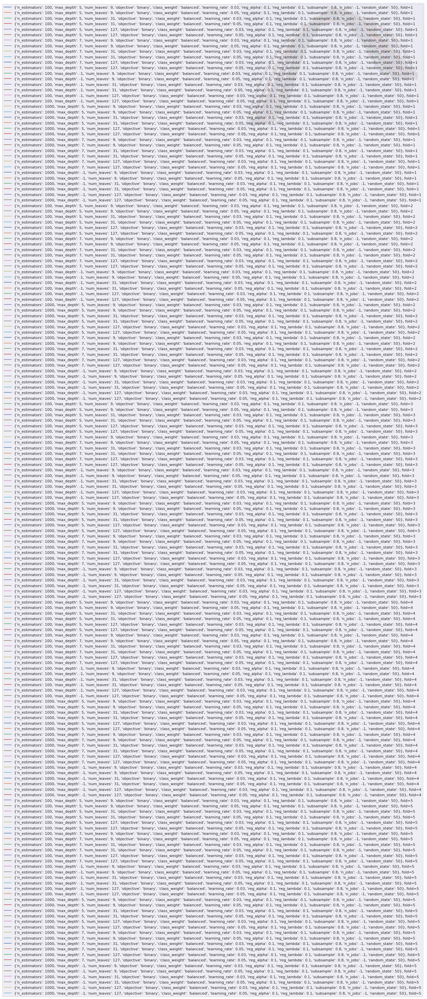

In [77]:
psdf = pd.DataFrame(plot_score_GL, columns=["x","y", "param", "fold"])
x= psdf["x"][0]
fig = plt.figure(figsize=(10,7))
ax = plt.subplot(111)
for idx, row in psdf.iterrows() : 
  y = row["y"]
  ax.plot(x, y, label=row["param"] + ", fold=" + str(row["fold"]))
  ax.scatter(x, y)
  ax.legend()
plt.show()

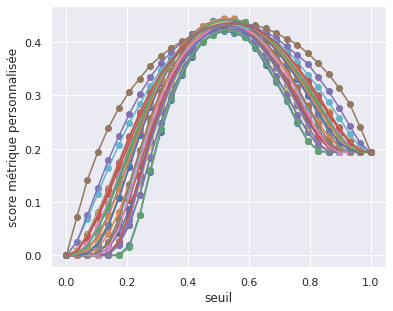

In [78]:
params = psdf["param"].unique()
mean_param_score_GL = []

for para in params : 
  meanfold_score = 0
  param_df = psdf.loc[psdf["param"] == para]
  for idx, row in param_df.iterrows() : 
    meanfold_score+=np.array(row["y"]) / param_df.shape[0]
  mean_param_score_GL.append(meanfold_score)
np.shape(np.transpose(mean_param_score_GL))

mean_param_score_GL_df = pd.DataFrame(np.transpose(mean_param_score_GL), columns=[params])


fig = plt.figure(figsize=(6,4.8))
ax = plt.subplot(111)

for k in range(np.shape(mean_param_score_GL_df)[1]) : 
  x= psdf["x"][0]
  # x= np.linspace(0, 1, 30)
  y = mean_param_score_GL_df.iloc[:, k]
  ax.plot(x, y, label=mean_param_score_GL_df.columns[k][0]      )
  ax.scatter(x, y)

ax.set_xlabel('seuil')
ax.set_ylabel('score métrique personnalisée')

plt.show()

mean_param_score_GL_df["thr"] =    psdf["x"][0]

In [79]:
mean_param_score_GL_df.columns[:-1] 

MultiIndex([(    '{'n_estimators': 100, 'max_depth': 5, 'num_leaves': 9, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.03, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}',),
            (    '{'n_estimators': 100, 'max_depth': 5, 'num_leaves': 9, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.05, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}',),
            (   '{'n_estimators': 100, 'max_depth': 5, 'num_leaves': 31, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.03, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}',),
            (   '{'n_estimators': 100, 'max_depth': 5, 'num_leaves': 31, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.05, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}',),
            (  '{'n_estimators': 100, 'm

In [80]:
score = 0
colmax = 0
imax = 0
thr = 0
for idx,row in mean_param_score_GL_df.iterrows() : 
    for col in mean_param_score_GL_df.columns[:-1] : 
        if ( row[col] >= score  ) : 
            score = row[col] 
            colmax = col
            imax = idx
THR_opti = mean_param_score_GL_df.iloc[imax,-1]
print("thr,colmax, imax, th", score,colmax, imax , THR_opti)

thr,colmax, imax, th 0.444802862972592 ("{'n_estimators': 1000, 'max_depth': 5, 'num_leaves': 9, 'objective': 'binary', 'class_weight': 'balanced', 'learning_rate': 0.03, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}",) 15 0.5172413793103449


In [271]:
# THR_opti = 0.5172413793103449
THR_opti

0.5172413793103449

### definition predict

In [82]:
THR_opti = 0.5172413793103449
def predict(y_pred_proba, thr = THR_opti) : 

  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(1)
    else : y_pred.append(0)
  return np.array(y_pred)

### Retrain model ALL Train set / best param

In [266]:
%%time
# define undersampling strategy
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold

fold = 0

x = X_train_imp.values
y = y_train.values # Classification

score_test = []

undersample = RandomUnderSampler(sampling_strategy='majority')

x_train_under, y_train_under = undersample.fit_resample(x, y)


param = {'n_estimators': 1000, 'max_depth': 5, 'num_leaves': 127, 
 'objective': 'binary', 'class_weight': 'balanced', 
 'learning_rate': 0.03, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 
 'subsample': 0.8, 'n_jobs': -1, 'random_state': 50}


model = lgb.LGBMClassifier(**param)
# model = RandomForestClassifier(random_state = 42, n_estimators = 500)

model.fit(x_train_under, y_train_under)

# y_pred_proba= model.predict_proba(xfold_test)

# y_true = yfold_test

# y_test_ohe = pd.get_dummies(y_true)

# score_test.append([test, str(param), fold, y_pred_proba, y_test_ohe, y_true])

CPU times: user 35.9 s, sys: 23.5 ms, total: 36 s
Wall time: 3.2 s


LGBMClassifier(class_weight='balanced', learning_rate=0.03, max_depth=5,
               n_estimators=1000, num_leaves=127, objective='binary',
               random_state=50, reg_alpha=0.1, reg_lambda=0.1, subsample=0.8)

### TEST

CPU times: user 13.8 s, sys: 60 ms, total: 13.8 s
Wall time: 1.4 s


,type_score,score
0,accuracy_score,0.688015
1,f1_score,0.264715
2,precision_score,0.163457
3,recall_score,0.695670
4,roc_auc_score,0.757293
5,score_GAIN,0.450951


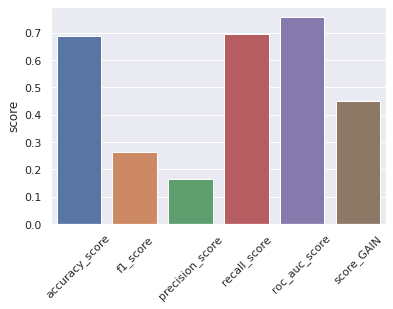

In [332]:
%%time




from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

y_true = y_test
y_test_ohe = pd.get_dummies(y_true)

y_pred_proba = model.predict_proba(X_test_imp)
y_pred = model.predict(X_test_imp)      
# np.argmax(y_pred_proba,axis=1)


metric_classique = []


metric_classique.append(["accuracy_score", accuracy_score(y_true, y_pred)])
metric_classique.append(["f1_score", f1_score(y_true, y_pred)])
metric_classique.append(["precision_score", precision_score(y_true, y_pred)])
metric_classique.append(["recall_score", recall_score(y_true, y_pred)])
metric_classique.append(["roc_auc_score",   roc_auc_score(y_test_ohe.values[:,1], y_pred_proba[:,1])])
metric_classique.append(["score_GAIN", score_GL(y_pred_proba,THR_opti,y_true, X_test_imp.index)])


df = pd.DataFrame(metric_classique, columns=["type_score", "score"])
sns.barplot(x="type_score", y="score", data=df)
plt.xticks(rotation=45)
plt.xlabel('')
df


<AxesSubplot:xlabel='Classe réelle', ylabel='Classe Predite'>

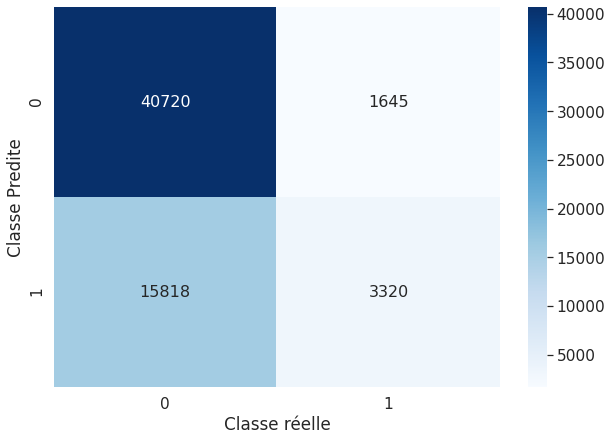

In [87]:

from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

y_pred = predict_thr(y_pred_proba, THR_opti)
confusion_matrix_output = confusion_matrix(y_pred,y_true)
df_cm = pd.DataFrame(confusion_matrix_output, columns=np.unique(y_true), index = np.unique(y_true))
df_cm.index.name = 'Classe Predite'
df_cm.columns.name = 'Classe réelle'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues",fmt='', annot=True,annot_kws={"size": 16})# font size

### SHAP

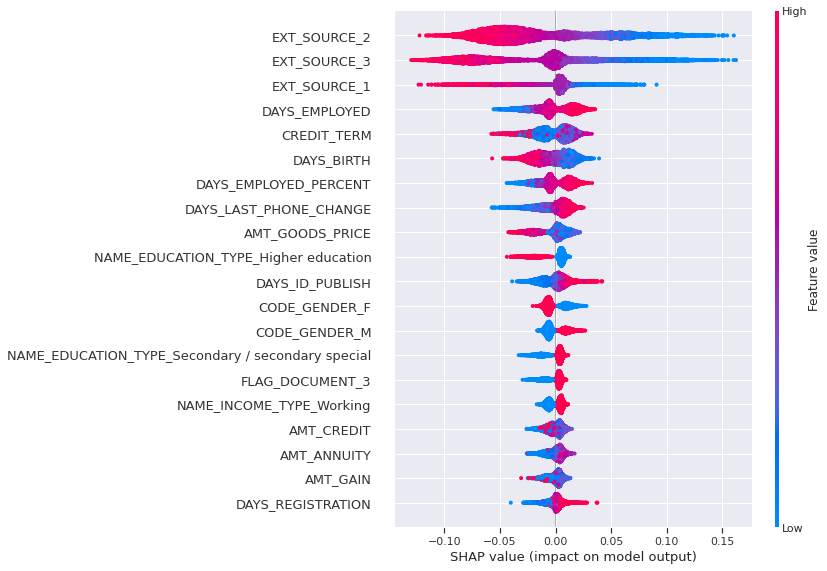

CPU times: user 11h 57min 7s, sys: 19.9 s, total: 11h 57min 27s
Wall time: 11h 56min 48s


In [133]:
%%time
import shap
import warnings


select = range(8000)
features = X_test.iloc[select]

explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(features)

# shap_values = shap.TreeExplainer(model).shap_values(features_scaled)
shap.summary_plot(shap_values[1], features)


In [ ]:
SHAP_400 =  36
SHAP_40 =  4

In [ ]:
# shap.summary_plot(shap_values, features)

In [132]:
360*2/60



12.0

## SAVE MODEL et DATA PICKEL

### data

In [101]:
from sklearn.model_selection import StratifiedKFold
from imblearn.under_sampling import RandomUnderSampler


kf = StratifiedKFold(20, shuffle=True, random_state=42) 

fold = 0

x = X_train_imp.values
y = y_train.values # Classification

print("xy", np.shape(x), np.shape(y))
model_under_folds = []

fold=0


undersample = RandomUnderSampler(sampling_strategy='majority')

for train, test in kf.split(x,y_train):  
    fold+=1
    xfold_test_fix= x[test]
    yfold_test_fix = y[test]
np.shape(xfold_test_fix), np.shape(yfold_test_fix)


xy (246008, 244) (246008,)


((12300, 244), (12300,))

In [ ]:
import pickle
# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
# Need to impute missing values
X_train_origin_imp = pd.DataFrame(imputer.fit_transform(X_train_origin), columns=X_train_origin.columns, index = X_train_origin.index)  

pickle.dump(X_train_origin_imp, open('data.sav', 'wb'))

In [102]:
import pickle
# imputer for handling missing values
# from sklearn.impute import SimpleImputer
# imputer = SimpleImputer(missing_values=np.nan, strategy='median')
# Need to impute missing values
X_train_20ieme = pd.DataFrame(imputer.fit_transform(xfold_test_fix), columns=X_train_origin.columns)  
y_train_20ieme = pd.DataFrame(yfold_test_fix)

pickle.dump(X_train_20ieme, open('data_20ieme.sav', 'wb'))
pickle.dump(y_train_20ieme, open('data_20ieme_y.sav', 'wb'))

### model

In [94]:
pickle.dump(model, open('LihgtGBM.sav', 'wb'))

# Fonctionnement serveur

In [177]:
import re
import numpy as np
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import datetime
sns.set()
print('The scikit-learn version is {}.'.format(sklearn.__version__))


The scikit-learn version is 0.23.2.


In [178]:
path = ""

import pickle

model = pickle.load(open(path+'LihgtGBM.sav', 'rb'))
print("model loaded")

data = pickle.load(open(path+'data_20ieme.sav', 'rb'))
print("data loaded")



 

model loaded
data loaded


In [209]:
model

LGBMClassifier(class_weight='balanced', learning_rate=0.03, max_depth=5,
               n_estimators=1000, num_leaves=127, objective='binary',
               random_state=50, reg_alpha=0.1, reg_lambda=0.1, subsample=0.8)

In [179]:
data

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,AMT_GAIN
0,0.0,0.0,1.0,0.000000,0.000935,0.170748,0.096297,0.127946,0.282797,0.666178,...,0.0,0.0,1.0,0.0,0.0,0.063660,0.103768,0.136985,0.883023,0.016443
1,0.0,0.0,1.0,0.000000,0.000742,0.213483,0.096332,0.214366,0.336758,0.669560,...,0.0,0.0,1.0,0.0,0.0,0.094359,0.124589,0.070024,0.862344,0.020565
2,0.0,0.0,1.0,0.105263,0.001704,0.224045,0.101141,0.158249,0.094492,0.373393,...,0.0,0.0,1.0,0.0,0.0,0.049370,0.065156,0.069984,0.992028,0.022660
3,0.0,0.0,1.0,0.000000,0.002089,0.160674,0.072710,0.161616,0.421848,0.702368,...,0.0,0.0,0.0,0.0,0.0,0.030038,0.039883,0.071830,0.836028,0.011683
4,0.0,0.0,1.0,0.052632,0.000358,0.014202,0.017006,0.012346,0.429796,0.212740,...,0.0,0.0,0.0,0.0,0.0,0.017756,0.047080,0.357422,0.736131,0.000242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12295,0.0,0.0,0.0,0.052632,0.000550,0.101124,0.120885,0.102132,0.143358,0.149267,...,0.0,0.0,1.0,0.0,0.0,0.058953,0.193058,0.492369,0.817541,0.012224
12296,0.0,1.0,1.0,0.000000,0.000742,0.157303,0.088768,0.158249,0.257000,0.751184,...,0.0,0.0,0.0,0.0,0.0,0.070755,0.115398,0.137174,0.582076,0.013964
12297,0.0,0.0,0.0,0.000000,0.001589,0.133569,0.172903,0.113356,0.491595,0.524803,...,0.0,0.0,0.0,0.0,0.0,0.032305,0.115704,0.558424,0.827171,0.023094
12298,0.0,0.0,0.0,0.052632,0.000396,0.124854,0.093296,0.102132,0.129705,0.085400,...,0.0,0.0,0.0,0.0,0.0,0.089284,0.188973,0.242111,0.960836,0.011648


In [180]:
THR_OPTI = 0.5172413793103449
def predict(y_pred_proba, thr = THR_OPTI) : 

  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(1)
    else : y_pred.append(0)
  return np.array(y_pred)

## recherche 1000 plus proche élément

In [181]:


col_distance =  ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', "DAYS_EMPLOYED","DAYS_BIRTH", "CREDIT_TERM"]



### test plusieurs fichier h5

In [182]:


def predict(y_pred_proba, thr = THR_OPTI) : 
  y_pred = []
  for prob in y_pred_proba[:, 1] : 
    if prob>= thr : y_pred.append(int(1))
    else : y_pred.append(int(0))
  return y_pred


y_proba = model.predict_proba(data)
y_pred = predict(y_proba)


### test 1 fichier h5

In [183]:
from scipy.spatial import distance_matrix
from sklearn.model_selection import StratifiedKFold
import h5py

nb_strat_fold = 2

kf = StratifiedKFold(nb_strat_fold, shuffle=True, random_state=42) 

fold = 0

x = data.loc[:,col_distance].values
y = np.array(y_pred) # Classification

print("xy", np.shape(x), np.shape(y))

fold_test=[]
client_distance = []



h5f = h5py.File('dist_clients.h5', 'w')


for train, test in kf.split(x,y):  


  fold+=1
  xfold_test = x[test] 
  yfold_test = y[test]
  print( fold ,"prop no loan", np.count_nonzero(yfold_test) / len(test), len(test), np.shape(xfold_test))

  fold_test.append(test)

  DM = distance_matrix(xfold_test,xfold_test) 
  print("calcul DM done")

  index = np.array([test]).T
  print( "index" ,   np.shape(index))

  distTab = np.concatenate((index,DM), axis=1)

  print("dist", np.shape(distTab), distTab[0][0], test[0], np.shape(distTab[0][:]))

  hdf5_set = "dist" + str(fold)
  h5f.create_dataset(hdf5_set, data=distTab)

h5f.close()

pickle.dump(fold_test, open('idx_clients.sav', 'wb'))




xy (12300, 6) (12300,)
1 prop no loan 0.3146341463414634 6150 (6150, 6)
calcul DM done
index (6150, 1)
dist (6150, 6151) 2.0 2 (6151,)
2 prop no loan 0.3146341463414634 6150 (6150, 6)
calcul DM done
index (6150, 1)
dist (6150, 6151) 0.0 0 (6151,)


### split fichier hdf5

In [184]:
def split_list(alist, wanted_parts=1):
    length = len(alist)
    aidx = list(np.arange(len(alist)))
    split = [ alist[i*length // wanted_parts: (i+1)*length // wanted_parts] 
             for i in range(wanted_parts) ]
    split_idx = [ aidx[i*length // wanted_parts: (i+1)*length // wanted_parts] 
             for i in range(wanted_parts) ]
    return split, split_idx

In [185]:
import h5py

idx_clients = pickle.load(open('idx_clients.sav', 'rb'))

fold = 0
tab = 0

idx_clients_split = []

h5f = h5py.File('dist_clients.h5','r')

n_split_matrix = 10

for f in idx_clients : 
  fold+=1
  b = h5f["dist"+str(fold)][:]

  split, g  = split_list(f, wanted_parts=n_split_matrix)

  print("matrice ", fold, "done ! ")

  for id_stock, index_split in enumerate(split) : 


    s = pd.Series(split[id_stock], index = g[id_stock])

    # s = pd.Series(split[id_stock])
    pickle.dump(s, open("idx_split" + str(tab) + ".sav", 'wb'))

    # ATTENTION : s.values = ID Client
    #             s.index = ID idx_clients
    #             s.iloc  = [0:1230]


    dist_select_row = b[g[id_stock], 1:]

  

    # print(id_stock, np.shape(dist_select_row),g[id_stock][0] )

    # if id_stock == 0 : print("id_stock == 0", dist_select_row[0, 0], "devrait être 0")
    # if id_stock == 9 : print("id_stock == 9 :                    ",dist_select_row[-1, -1], "devrait être 0")


    h5f_split = h5py.File("dist_split" + str(tab) + ".h5", 'w')
    h5f_split.create_dataset('dist', data=dist_select_row)
    h5f_split.close()
    tab+=1

  # print(np.shape(split))





h5f.close()

matrice  1 done ! 
matrice  2 done ! 


In [186]:
idx_clients = pickle.load(open('idx_clients.sav', 'rb'))
idx_clients

[array([    2,     6,    10, ..., 12293, 12294, 12296]),
 array([    0,     1,     3, ..., 12297, 12298, 12299])]

In [187]:

import h5py
import time
import numpy as np
import pickle
idx_clients = pickle.load(open('idx_clients.sav', 'rb'))


id_client = 34

t_start = time.time()

nbr_nmatrix = nb_strat_fold
nbr_split_nmatrix = n_split_matrix

nbr_sub = nbr_nmatrix * nbr_split_nmatrix 

nsub = "numero de la sub du client"
s_id = "numero de ligne de la sub du client"


for tab in np.arange(nbr_sub) : 
  s = pickle.load(open("idx_split" + str(tab) + ".sav", 'rb'))

  
  idx_d = np.where(s.values == id_client)[0]

  if len(idx_d) == 1 : 
    print("on a stocké dans 's' uniquement les ID client des lignes de la sub : s_id. Dimension  =", np.shape(s))
    
    nsub = tab
    s_id = idx_d[0]

    print("le client est dans la sub" , nsub, " à la s_id", s_id)

s = pickle.load(open("idx_split" + str(nsub) + ".sav", 'rb')) # on s = [s_id] du client

nmatrix = int(nsub / nbr_split_nmatrix) # numero de la matrix du client
c_id = s.index[s_id] # numero de colonne de la matrix du client

print( "la ligne s_id:",s_id, "de la sub", nsub ,  "correspond à la colonne c_id:", c_id, "de la matrice", nmatrix)

col = idx_clients[nmatrix] # colonne matrix du client

print("les colonnes de la matrix du client sont de dimension", np.shape(col))
print("on confirme que le numéro du client est par les colonnes c_id: ", col[c_id], ", donc = au numero du client : ", id_client)
print("on confirme que le numéro du client est par la sub s_id: ", s.iloc[s_id])

h5f = h5py.File("dist_split" + str(nsub) + ".h5",'r') # on charge la sub des distances entre les clients 
b = h5f['dist'][:]
dist = b[s_id,:] # on selectionne la ligne de la sub du client 
h5f.close()

print("la ligne de la sub est de dimension ", np.shape(dist))
print("la distance du client avec lui même devrait être nulle : ", dist[c_id])

idx_d_500_kkn = list(np.argpartition(dist,500))[0:500] # on selectionne les 500 clients les plus proches en distance sans ordre (dans la sub)
idx_knn_client = np.where(idx_d_500_kkn == c_id)[0][0] # on trouve dans cette liste knn non ordonné le c_id du client (dans la sub)
idx_d_500_kkn.pop(np.where(idx_d_500_kkn == c_id)[0][0]) # on enlève la distance du client avec lui même (0)

print("on a trouvé les 499 plus proches voisins du client dans la sub ", np.shape(idx_d_500_kkn))

idx_500_kkn = col[idx_d_500_kkn]

print("les ID des 10 clients parmis les 499 plus proches voisins sont : \n", idx_500_kkn[:10])



on a stocké dans 's' uniquement les ID client des lignes de la sub : s_id. Dimension  = (615,)
le client est dans la sub 0  à la s_id 14
la ligne s_id: 14 de la sub 0 correspond à la colonne c_id: 14 de la matrice 0
les colonnes de la matrix du client sont de dimension (6150,)
on confirme que le numéro du client est par les colonnes c_id:  34 , donc = au numero du client :  34
on confirme que le numéro du client est par la sub s_id:  34
la ligne de la sub est de dimension  (6150,)
la distance du client avec lui même devrait être nulle :  0.0
on a trouvé les 499 plus proches voisins du client dans la sub  (499,)
les ID des 10 clients parmis les 499 plus proches voisins sont : 
 [ 5574  2150 11203  8131  8127    14 11198  2126    19  2123]


In [188]:

print("la verification de calcul de distance au client pour terminer : ")

id_clients_matrix = col # ce sont les id les clients de la matrix où a été calculé les distance entre chacun

# data_du_client = data.loc[id_client, col_distance]
# data_clients = data.loc[id_clients_matrix, col_distance]

test = 0
for k in idx_500_kkn : 
  if k in id_clients_matrix : test+=1

print(test)

distances = []
for id in id_clients_matrix : 
  distances.append(  [id, np.linalg.norm(data.loc[id_client, col_distance] - data.loc[id, col_distance])]    )

distances = np.array(distances)

max_dist = 0.
for id_cl in idx_500_kkn : 
  id = np.where(distances[:,0] == id_cl)[0][0]
  max_dist= max(max_dist, distances[id,1])

test = []
for id,row in enumerate(distances) : 

  if distances[id, 1] <= max_dist : 
    if int(distances[id, 0] != id_client) : test.append(int(distances[id, 0]))
    
test = np.array(test)
type(idx_500_kkn)

count = 0
for k in test : 
  if k in idx_500_kkn : count+=1
if (count == len(idx_500_kkn)) : print("c'est bingo ! ")


la verification de calcul de distance au client pour terminer : 
499
c'est bingo ! 


### dernière fonction calcul 

In [191]:

import h5py
def knn(id_client) : 

    path = ""

    idx_clients = pickle.load(open('idx_clients.sav', 'rb'))


    nbr_nmatrix = nb_strat_fold
    nbr_split_nmatrix = n_split_matrix

    nbr_sub = nbr_nmatrix * nbr_split_nmatrix 

    nsub = "numero de la sub du client"
    s_id = "numero de ligne de la sub du client"


    for tab in np.arange(nbr_sub) : 
        s = pickle.load(open("idx_split" + str(tab) + ".sav", 'rb'))

        
        idx_d = np.where(s.values == id_client)[0]

        if len(idx_d) == 1 : 
#             print("on a stocké dans 's' uniquement les ID client des lignes de la sub : s_id. Dimension    =", np.shape(s))
            
            nsub = tab
            s_id = idx_d[0]

#             print("le client est dans la sub" , nsub, " à la s_id", s_id)

    s = pickle.load(open('idx_split' + str(nsub) + ".sav", 'rb')) # on s = [s_id] du client

    nmatrix = int(nsub / nbr_split_nmatrix) # numero de la matrix du client
    c_id = s.index[s_id] # numero de colonne de la matrix du client

#     print( "la ligne s_id:",s_id, "de la sub", nsub ,    "correspond à la colonne c_id:", c_id, "de la matrice", nmatrix)

    col = idx_clients[nmatrix] # colonne matrix du client

#     print("les colonnes de la matrix du client sont de dimension", np.shape(col))
#     print("on confirme que le numéro du client est par les colonnes c_id: ", col[c_id], ", donc = au numero du client : ", id_client)
#     print("on confirme que le numéro du client est par la sub s_id: ", s.iloc[s_id])

    h5f = h5py.File("dist_split" + str(nsub) + ".h5",'r') # on charge la sub des distances entre les clients 
    b = h5f['dist'][:]
    dist = b[s_id,:] # on selectionne la ligne de la sub du client 
    h5f.close()

#     print("la ligne de la sub est de dimension ", np.shape(dist))
#     print("la distance du client avec lui même devrait être nulle : ", dist[c_id])

    idx_d_500_kkn = list(np.argpartition(dist,500))[0:500] # on selectionne les 500 clients les plus proches en distance sans ordre (dans la sub)
        
#     print("c_id", c_id)
    
#     if (c_id in idx_d_500_kkn) : print("c_id est dans les 500 knn")
#     idx_knn_client = np.where(idx_d_500_kkn == c_id)[0][0] # on trouve dans cette liste knn non ordonné le c_id du client (dans la sub)
    
#     idx_d_500_kkn.pop(np.where(idx_d_500_kkn == c_id)[0][0]) # on enlève la distance du client avec lui même (0)

#     print("on a trouvé les 500 plus proches voisins du client dans la sub ", np.shape(idx_d_500_kkn))

    idx_500_kkn = col[idx_d_500_kkn]

#     print("les ID des 10 clients parmis les 499 plus proches voisins sont : \n", idx_500_kkn[:10])
    
#     print("id_client", col[c_id],id_client )

    return idx_500_kkn

In [194]:
knn(12299)

array([  740, 12299, 12285, 12281, 12221, 12206, 12205, 12173, 12170,
       12114, 12048, 11985, 11881,    23, 11880, 11826, 11801, 11780,
       11714, 11694,    35, 11657, 11639, 11604, 11587, 11535, 11477,
       11448, 11436,    56, 11392, 11335, 11317, 11299, 11283, 11273,
       11269, 11227, 11224, 11156, 11134, 11086, 10916, 10857, 10826,
       10796, 10785, 10767, 10755, 10743, 10737, 10541, 10522, 10499,
       10479,   107, 10471, 10443,   110, 10396, 10346, 10334, 10332,
       10328, 10252, 10225, 10217, 10132, 10121, 10110, 10099, 10094,
       10078, 10069, 10068, 10044, 10039, 10023,  9984,  9915,  9909,
        9793,  9790,  9786,  9766,  9721,  9708,  9690,   166,  9671,
        9662,  9624,  9580,  9549,  9526,  9506,  9473,  9470,  9389,
        9352,  9335,  9322,  9313,   196,  9271,  9267,  9265,  9183,
        9170,  9050,  9049,  9043,  8936,  8929,  8922,  8910,  8876,
        8826,  8819,  8700,  8670,  8660,  8626,   233,  8565,  8550,
        8527,  8505,

In [198]:
np.shape(idx_clients)[1]

6150

In [199]:
%%time

import pickle


paquet = np.shape(idx_clients)[1]

knn_full = []

for fold in range(nb_strat_fold) : 
    
    knn_paquet = [] 
    
    start = fold * paquet
    stop = (fold+1)* paquet
    if fold == 24 : stop = len(data)
    print(range(start, stop)[0], range(start, stop)[-1])
    
    for idx in range(start, stop)  : 
        knn_paquet.append(knn(idx))
    
    s_knn_paquet = pd.Series(knn_paquet, index = range(start, stop))
    
    name = "paquet_{}.sav".format(fold)
    
    pickle.dump(s_knn_paquet, open(name, 'wb'))
    
    knn_full.append(knn_paquet)
knn_full

0 6149
6150 12299
CPU times: user 34.9 s, sys: 43.4 s, total: 1min 18s
Wall time: 1min 18s


[[array([11906,     0,  7193,  1142,  6588,  6315,  8267,  8341,  8617,
          5421,   709,  2387,  4615,  9976, 10156, 10387,  3849,   333,
          3495,  3188,  3138, 11680, 11724,   109,  2748,  1086, 10754,
          9763,  1081,  2598,  7308,  7140,  7440,  7586,  6792,  7780,
          6691,    70,  7793, 11836,  6645,  1273,  7937,  1277,  2352,
          8082,  1289,  6275,  6271,  8164,  2119,  6265,  8183, 11746,
          8184,  2810, 11730,  6150,  8327,   871, 11699,  8338,  8349,
          6010, 11966,  6004,  5999,  2936,   838,  8567,  5799,  2973,
          3005,  8683,  5639,  5545,  5492,   763, 11582,  8883,  5454,
          5432,  2041,  5369,  5342,  8986,  8990,  5318,  5276,  9109,
           173,  1501,  5250,  9173,  9191,  5216,   677,   673,  5182,
          1540,  5052,  3145,  9387, 11402,  9417,  9594, 11366,  1596,
          3182,   204,  2435,  3194,  9610,  3226,  9611,  9633,  4769,
          4761,  3284,  4747,  9705,  4669,  9762,  3423,  9812,

In [200]:
np.shape(knn_full)

(2, 6150, 500)

In [203]:
len(knn_full[1])

6150

In [204]:
knn_flat = []
for fold in range(nb_strat_fold) :
    for list_ in knn_full[fold] : 
        knn_flat.append(list_)


In [205]:
s_knn_flat = pd.Series(knn_flat)
s_knn_flat

0        [11906, 0, 7193, 1142, 6588, 6315, 8267, 8341,...
1        [680, 12299, 12285, 12236, 12205, 12125, 12083...
2        [10873, 3546, 3582, 3616, 3617, 3499, 3631, 36...
3        [4144, 5788, 3, 2083, 5742, 2098, 5897, 9, 122...
4        [10335, 4234, 12298, 4, 4284, 12280, 4326, 122...
                               ...                        
12295    [11889, 8738, 5006, 4956, 4924, 12295, 5139, 4...
12296    [609, 3878, 1246, 5924, 2053, 14, 8807, 4689, ...
12297    [10976, 6589, 12297, 8323, 2260, 7, 8300, 2182...
12298    [788, 2928, 12298, 4, 10286, 2938, 8831, 12280...
12299    [740, 12299, 12285, 12281, 12221, 12206, 12205...
Length: 12300, dtype: object

### export FULL model

In [206]:
pickle.dump(s_knn_flat, open("knn_1_20ieme.sav", 'wb'))

In [207]:
import pickle
s_knn_flat = pickle.load(open('knn_1_20ieme.sav', 'rb'))

In [208]:
s_knn_flat[0]

array([11906,     0,  7193,  1142,  6588,  6315,  8267,  8341,  8617,
        5421,   709,  2387,  4615,  9976, 10156, 10387,  3849,   333,
        3495,  3188,  3138, 11680, 11724,   109,  2748,  1086, 10754,
        9763,  1081,  2598,  7308,  7140,  7440,  7586,  6792,  7780,
        6691,    70,  7793, 11836,  6645,  1273,  7937,  1277,  2352,
        8082,  1289,  6275,  6271,  8164,  2119,  6265,  8183, 11746,
        8184,  2810, 11730,  6150,  8327,   871, 11699,  8338,  8349,
        6010, 11966,  6004,  5999,  2936,   838,  8567,  5799,  2973,
        3005,  8683,  5639,  5545,  5492,   763, 11582,  8883,  5454,
        5432,  2041,  5369,  5342,  8986,  8990,  5318,  5276,  9109,
         173,  1501,  5250,  9173,  9191,  5216,   677,   673,  5182,
        1540,  5052,  3145,  9387, 11402,  9417,  9594, 11366,  1596,
        3182,   204,  2435,  3194,  9610,  3226,  9611,  9633,  4769,
        4761,  3284,  4747,  9705,  4669,  9762,  3423,  9812,  9834,
        1088,  9942,